### Loading the super-tensor and creating the temporal networks

In this notebook we will explore the class __temporal_nets__ to compute preliminar results using network analysis.

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
# Adding GDa to path
import sys
sys.path.insert(1, '/home/vinicius/GrayData-Analysis')
# Importing the temporal network class
from   GDa.temporal_network              import temporal_network
from   GDa.misc.create_grids             import create_stages_time_grid
from   GDa.misc.reshape                  import reshape_trials, reshape_observations
from   GDa.net.util                      import compute_coherence_thresholds, \
                                                convert_to_adjacency
from   GDa.graphics.plot_raster          import plot_nodes_raster_all_bands 
from   GDa.graphics.plot_coherence_dists import plot_pooled_coherence_dists,\
                                                plot_pooled_coherence_dists_per_stage,\
                                                plot_pooled_coherence_dists_per_stim
from   GDa.graphics.plot_adjacency       import plot_adjacency 
from   GDa.net.layerwise                 import *
from   GDa.net.null_models               import *
from   GDa.net.temporal                  import *
import numpy                 as     np
import networkx              as     nx
import matplotlib.pyplot     as     plt
import igraph                as     ig
import leidenalg
import scipy.signal
import time
from   tqdm                  import tqdm
from   joblib                import Parallel, delayed
from   scipy                 import stats

# Just an auxiliary function to sommoth plots
def smooth(x, w):
    return scipy.signal.fftconvolve(x, np.ones(w)/w, mode='same')
# Just an auxiliary function to compute z-score
def zscore(x):
    z = np.zeros_like(x)
    for i in range(len(z)):
        if x.std() == 0:
            continue
        else:
            z[i] = (x[i]-x.mean())/x.std()
    return z
# Bands names
bands   = [r'band 1', r'band 2', r'band 3', r'band 4', r'band 5']
s_names = ['baseline', 'cue', 'delay', 'match'] 

To instantiate the __temporal_network__ we have to supply the monkey name, the session, and date to its constructor.

In [4]:
# Instantiating a temporal network object
net = temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', 
                       monkey='lucy', session=1, date='150128')

When instantiated, the temporal network object will load the recording info for the monkey, date, and sesion specified as well as the super tensor;

The super-tensor has dimensions [Number of pairs, Number of frequency bands, Number of trials, Time]. For Lucy the frequency bands analysed are:

- band $1$  = [0.1,6]  Hz;
- band $2$  = [6,14]   Hz;
- band $3$  = [14,26]  Hz;
- band $4$  = [26,42]  Hz;
- band $5$  = [42,80]  Hz;

It is possible to check which recording information was recordes by acessing the __session_info__ dictionary:

In [5]:
net.super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 750, time: 244)>
array([[[[9.55596924e-01, 9.58406031e-01, 9.61017668e-01, ...,
          3.64816785e-01, 3.80801529e-01, 3.91314983e-01],
         [9.77305114e-01, 9.71951008e-01, 9.66663063e-01, ...,
          3.16378810e-02, 3.38533297e-02, 3.25365737e-02],
         [9.64626431e-01, 9.58078086e-01, 9.50588822e-01, ...,
          6.57277822e-01, 7.12505937e-01, 7.59780526e-01],
         ...,
         [5.68966508e-01, 5.23176730e-01, 4.85127181e-01, ...,
          4.02420849e-01, 3.53678882e-01, 2.95402497e-01],
         [9.02672052e-01, 8.96568418e-01, 8.90965044e-01, ...,
          3.64189982e-01, 3.47266018e-01, 3.29461038e-01],
         [5.38226962e-01, 5.64544380e-01, 5.85812628e-01, ...,
          4.87758547e-01, 5.52922070e-01, 6.14427090e-01]],

        [[7.94712842e-01, 7.91017354e-01, 7.81942904e-01, ...,
          5.32285154e-01, 5.27550578e-01, 4.97824192e-01],
         [8.75010669e-01, 8.55535388e-01, 8.32608163e-01, ...,
          2.23236233e-01, 1.26847759e-01, 6.66271374e-02],
         [9.81676400e-01, 9.81518388e-01, 9.81350124e-01, ...,
          4.25080687e-01, 4.79472339e-01, 5.34512043e-01],
         ...,
         [3.35806251e-01, 2.82888502e-01, 2.38644719e-01, ...,
          4.53637466e-02, 1.35969212e-02, 1.36923054e-02],
         [4.72360700e-01, 4.39786762e-01, 3.98360491e-01, ...,
          1.44577980e-01, 1.56683981e-01, 1.83921129e-01],
         [5.59617579e-01, 5.10706186e-01, 4.71517801e-01, ...,
          7.30750322e-01, 7.88518369e-01, 8.26331258e-01]],

        [[9.08125162e-01, 9.03257906e-01, 8.96858633e-01, ...,
          7.20915616e-01, 6.98962569e-01, 6.76571548e-01],
         [4.13529754e-01, 3.88550013e-01, 3.65073681e-01, ...,
          7.77207851e-01, 7.75359094e-01, 7.63130009e-01],
         [8.79007101e-01, 8.63165677e-01, 8.45108867e-01, ...,
          6.47807062e-01, 6.40639007e-01, 6.38377190e-01],
         ...,
         [8.28743935e-01, 8.17471743e-01, 8.06468189e-01, ...,
          4.86999184e-01, 5.29020369e-01, 5.88391423e-01],
         [9.42947805e-01, 9.39638674e-01, 9.23966944e-01, ...,
          5.14575064e-01, 5.20255506e-01, 5.53530753e-01],
         [8.77166450e-01, 8.50367486e-01, 8.15931261e-01, ...,
          8.03535938e-01, 7.92129457e-01, 7.88146794e-01]],

        [[7.21457064e-01, 6.89064503e-01, 6.25209749e-01, ...,
          3.61254156e-01, 3.47886890e-01, 3.22741866e-01],
         [7.13622391e-01, 7.12086141e-01, 7.23309457e-01, ...,
          7.94217765e-01, 7.75577486e-01, 7.66849279e-01],
         [2.19296485e-01, 2.29219541e-01, 2.66390264e-01, ...,
          6.64160430e-01, 6.64714336e-01, 6.57068014e-01],
         ...,
         [5.47504537e-02, 4.02523950e-02, 3.41530442e-02, ...,
          8.20617974e-01, 8.35338414e-01, 8.24556887e-01],
         [7.96241581e-01, 7.30675817e-01, 6.58362329e-01, ...,
          3.88963409e-02, 5.39026968e-02, 7.32237846e-02],
         [3.48192334e-01, 2.67958403e-01, 1.88103601e-01, ...,
          7.05524862e-01, 6.72754884e-01, 6.22062683e-01]],

        [[9.96822957e-03, 4.93339542e-03, 5.17374091e-03, ...,
          9.18443918e-01, 9.22129214e-01, 9.19669628e-01],
         [2.30341285e-01, 2.87137091e-01, 3.08712482e-01, ...,
          6.04267418e-01, 6.03568971e-01, 5.95559418e-01],
         [3.55367362e-01, 3.40083063e-01, 3.03206861e-01, ...,
          3.58483762e-01, 4.13186073e-01, 4.54917580e-01],
         ...,
         [5.17817318e-01, 5.00549734e-01, 4.47036207e-01, ...,
          4.03032631e-01, 4.64804888e-01, 5.98242044e-01],
         [3.24402452e-01, 3.26425195e-01, 3.11331838e-01, ...,
          1.43310726e-01, 1.00213334e-01, 1.66815832e-01],
         [3.18744808e-01, 2.83392012e-01, 2.54792124e-01, ...,
          6.20961666e-01, 7.04165995e-01, 7.34751463e-01]]],


       [[[9.55149353e-01, 9.52897727e-01, 9.50224102e-01, ...,
          9.33534741e-01, 9.30709720e-01, 9.25673485e-01],
         [9.94515896e-01, 9.93819296e-01, 9.93263781e-01, ...,
      

In [6]:
print('Recording info available:\n')
print(list(net.super_tensor.attrs.keys()))

Recording info available:

['nT', 'areas', 'channels_labels', 'fsample', 'indch', 'nC', 'nP', 'pairs', 'stim', 't_cue_off', 't_cue_on', 't_match_on']


We can plot the super tensor to visualize the time series of link strength for each band (here we plot 10 trials for better visualization).

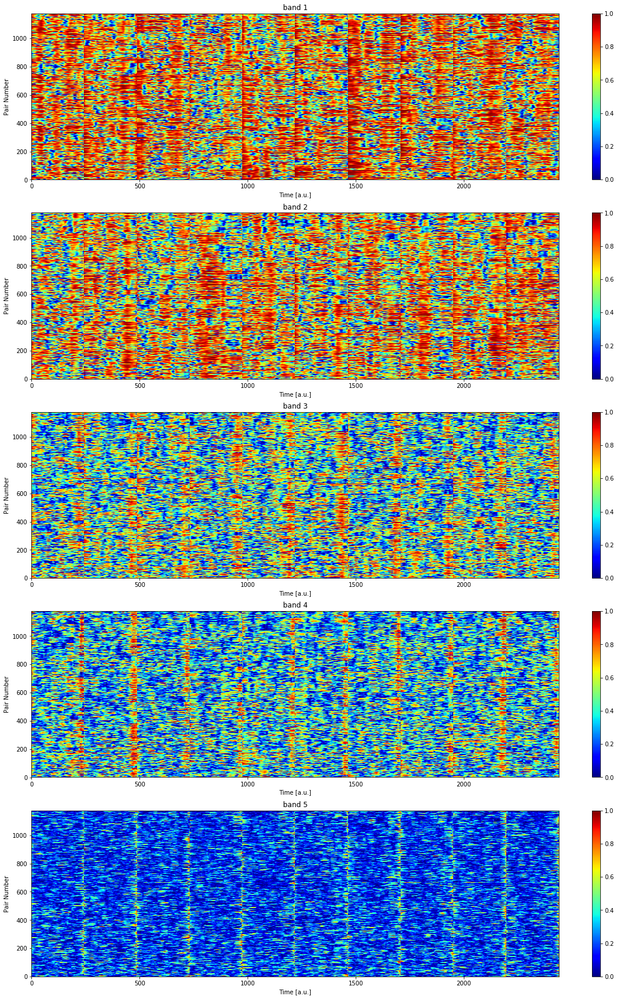

In [7]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'jet', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor_no_trim.png')

Notice that strong vertical stripes appear at the beggining/ending of each trial in the image above. This is due artifacts during wavelet estimation of pairwise coherences. To remove the border artifacts it is possible to instantiate the __temporal_network__ class specifing the parameter __trim_borders__ = True, and a value to the parameter __wt__. Doing that the firs and last __wt__ time points of the super tensor and the time array will be removed.

In [8]:
# Instantiating a temporal network object specifing trim_borders and wt.
net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                        session=1, date='150128', trim_borders=True, wt=(20,30))

Now let's plot the super tensor for the first ten trials again and observe that now the vertical stripes are gone.

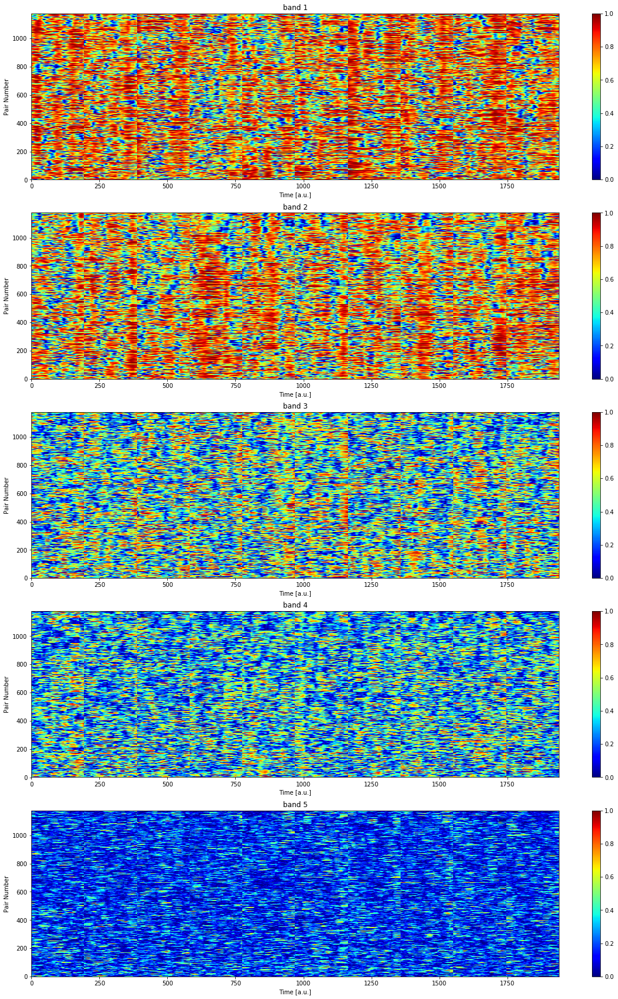

In [9]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'jet', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor.png')

### Thresholding

Some of the network theory measures can be applied to the binarized version of the network and in order to do so it is necessary to define thresholds for the coherence values, this can be done with the method __compute_thresholds__, this method receives a parameter __q__ between $0$ and $1$ that specifies that only links with coherence values in the top $(1-q)$ of the distribution will be kept.

The parameter __relative__ should be set as __False__ in case a common threshold (for each frequency band and trial) should be used for all the links or as __True__ if a threshold for each link (in each frequency band and trial) should be used instead.

In [ ]:
coh_thr = compute_coherence_thresholds(net.super_tensor.values,q=0.8,relative=True)

In [ ]:
coh_thr

In [ ]:
plt.figure(figsize=(10,6))
plt.subplot2grid((2,3), (0,0), rowspan=2, colspan=2)
plt.imshow(coh_thr[:,1,:], aspect='auto', cmap='jet', origin='lower'); plt.colorbar()
plt.ylabel('Link id', fontsize=15)
plt.xlabel('Trial number', fontsize=15)
plt.title('Coherence thresholds')
plt.subplot2grid((2,3), (0,2), rowspan=2, colspan=1)
mean_coh_thr = coh_thr[:,1,:].std(dim='trials')
plt.plot(mean_coh_thr, coh_thr.links.values)
plt.yticks([])
plt.tight_layout()

Since the __super_tensor__ and the __coh_thr__ variables are xarrays, the first can be easily thresholded.

In [ ]:
st_b = net.super_tensor > coh_thr

In [ ]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(st_b[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'gray', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])

Alternatvely, the __temporal_network__ class can also be instantiated by setting threshold as __True__ this will automatically threshold the super-tensor.

In [10]:
# Instantiating a temporal network object without thresholding the data
net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                        session=1, date='150128', trim_borders=True, wt=(20,30), threshold=True, 
                        relative=True, q=0.8)

Computing coherence thresholds


100%|██████████| 5/5 [00:55<00:00, 11.07s/it]


In [11]:
net.super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 750, time: 194)>
array([[[[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True, False, ..., False, False,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False,  True,  True, ..., False, False,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]]],


       [[[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]],


       [[[False, False, False, ..., False, False, False],
         [ True, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, 

In [12]:
print('Recording info available:\n')
print(list(net.super_tensor.attrs.keys()))

Recording info available:

['nT', 'areas', 'channels_labels', 'fsample', 'indch', 'nC', 'nP', 'pairs', 'stim', 't_cue_off', 't_cue_on', 't_match_on']


Let's plot the binarized super tensor:

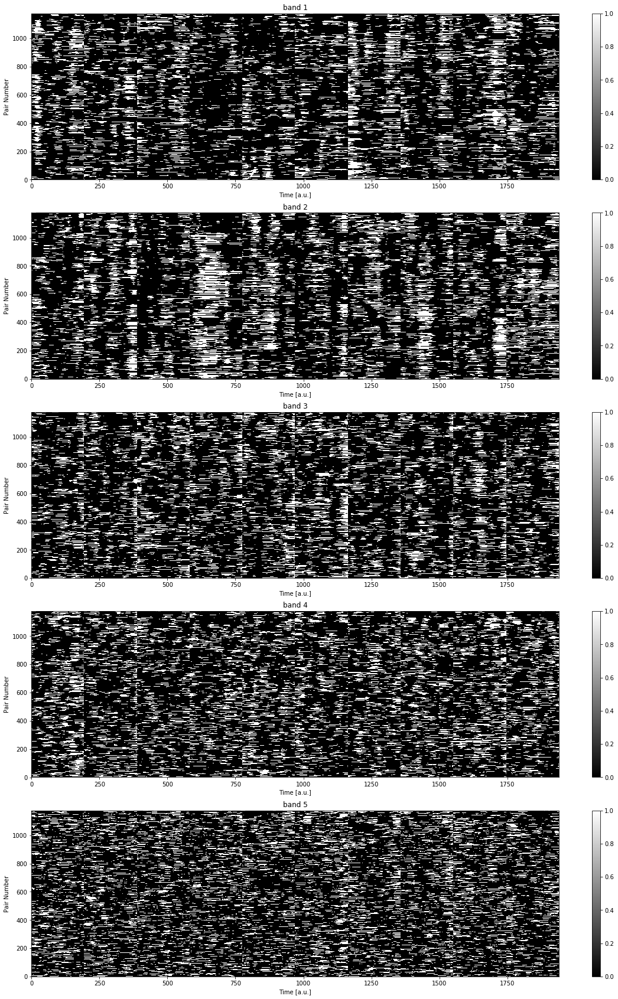

In [13]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'gray', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor_thresholded.png')

To use the Python package networkx or igraph to compute network theory quantities it is necessary to instantiate a __Graph__ object, to do so we have to provide an adjacency matrix to the __Graph__ method. Note that the super tensor is the edge representation of the network, but we can convert it to an adjacency matrix by calling the methdo __convert_to_adjacency__ in the class __temporal_network__. This method will create the variable __A__ inside the object.

In [14]:
net.convert_to_adjacency()

The adjacency matrix has dimensions [Number of channels, Number of channels Number of frequency bands, Number of trials * Time]. Let's plot both the weighted and binary adjancency matrix for the 10th observation (or time stamp) of the alpha band.

In [15]:
net.A

<xarray.DataArray (roi_1: 49, roi_2: 49, bands: 5, trials: 750, time: 194)>
array([[[[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 0., ..., 0., 0., 1.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 1., 1., ..., 0., 0., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.]]],


        [[[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [1., 1., 1., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0.,

In [16]:
print( net.A.shape )

(49, 49, 5, 750, 194)


Text(0.5, 1.0, 'Binarized, band1 observation 106')

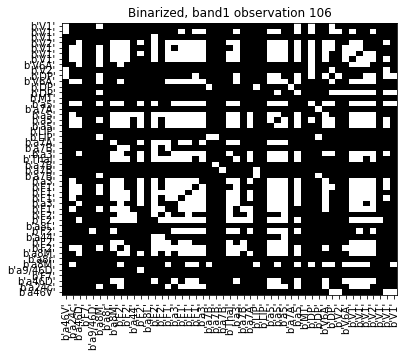

In [17]:
# Random time stamp
t_rnd = np.random.randint(0, net.super_tensor.shape[-1])
plt.figure(figsize=(6,5))
plt.imshow(net.A[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin = 'lower')
plt.xticks(range(net.A.shape[0]),net.session_info['areas'], rotation=90)
plt.yticks(range(net.A.shape[0]),net.session_info['areas'])
plt.title(r'Binarized, band1 observation ' + str(t_rnd))

Before moving to the measures and preliminary results, during the analysis we may be interested to separate the measures we make by task stage, to do so we need some way to acess our arrays (super_tensor, adjacency matrix, node_degree...) in an specific stage. Using the method __create_stages_time_grid__ (from __GDa.misc.create_grids__), four arrays will be returned: __t_baseline__, __t_cue__, __t_delay__, and __t_match__. Using those array any stage can be acessed easily, let's suposse you want the super tensor values only for the delay period in alpha band, you can retrieve this values by doing:

```net.super_tensor[:,1,s_mask['delay']] ```

In [18]:
# Creating stages mask
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'], net.super_tensor.attrs['t_cue_off'],
                                 net.super_tensor.attrs['t_match_on'], net.super_tensor.attrs['fsample'],
                                 net.tarray, net.super_tensor.attrs['nT'])

Now let's plot for each trial the duration of each period

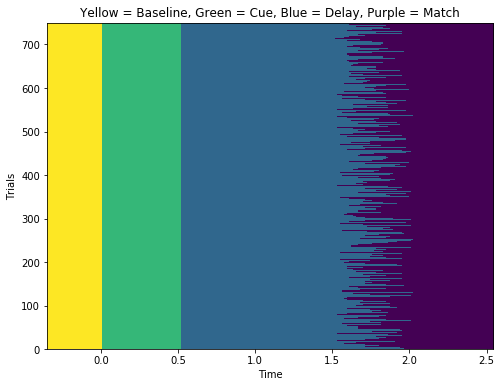

In [19]:
stages = np.zeros([net.super_tensor.attrs['nT'],len(net.tarray)])

ii     = [s_mask['baseline'], 
          s_mask['cue'], 
          s_mask['delay'],
          s_mask['match']]

for i in range(4):
    stages = stages - i * ii[i]
    
plt.figure(figsize = (8,6))
plt.imshow(stages, aspect='auto',cmap='viridis',origin='lower', extent=[net.tarray[0],net.tarray[-1],1,net.session_info['nT']])
plt.ylabel('Trials')
plt.xlabel('Time')
plt.title('Yellow = Baseline, Green = Cue, Blue = Delay, Purple = Match')
plt.savefig('../figures/layerwise_net/stages.png')

In [ ]:
# Values of q used
q_list     = np.linspace(0.2, 0.9, 10)
n_retained = np.zeros([len(q_list), len(net.bands), 4]) # [Values of q, Number of bands, Number of stages]
# Computing the threshold for the specific q value
for i in tqdm( range( len( q_list) ) ):
    # Instantiating a temporal network threshold with the respective q value
    net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                            session=1, date='150128', trim_borders=True, wt=(20,30), threshold=True, 
                            relative=True, q=q_list[i])
    for j in range( len(net.bands) ):
        # Binary super tensor
        bst               = net.super_tensor[:,j,:]
        n_retained[i,j,0] = bst[:,s_mask['baseline']].sum() / (net.session_info['nP'] * np.sum(s_mask['baseline']))
        n_retained[i,j,1] = bst[:,s_mask['cue']].sum()      / (net.session_info['nP'] * np.sum(s_mask['cue']))
        n_retained[i,j,2] = bst[:,s_mask['delay']].sum()    / (net.session_info['nP'] * np.sum(s_mask['delay']))
        n_retained[i,j,3] = bst[:,s_mask['match']].sum()    / (net.session_info['nP'] * np.sum(s_mask['match']))

In [ ]:
plt.figure(figsize=(6,20))
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    plt.semilogy(q_list, n_retained[:,j,0], label = 'Baseline')
    plt.semilogy(q_list, n_retained[:,j,1], label = 'Cue')
    plt.semilogy(q_list, n_retained[:,j,2], label = 'Delay')
    plt.semilogy(q_list, n_retained[:,j,3], label = 'Match')
    plt.title(bands[j] + ' band')
    plt.legend()
    plt.xlabel('q')
    plt.ylabel('Fraction of retained links')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/fraction_reained_links.png')

In [26]:
# Setting threshold back to q=0.8
net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                        session=1, date='150128', trim_borders=True, wt=(20,30), threshold=True, 
                        relative=True, q=0.8)

In [27]:
net.convert_to_adjacency()

### Null models and temporal correlations

#### Creating null models for each band and randomized edges and time frames.

In [22]:
# Shuffling frames
A_s = np.empty_like(net.A)
# Randomizing edges
A_r = np.empty_like(net.A)

In [23]:
for t in tqdm( range(net.super_tensor.attrs['nT']) ):
    for i in range(len(net.bands)):
        A_s[:,:,i,t,:] = shuffle_frames(net.A[:,:,i,t,:].values)


 82%|████████▏ | 613/750 [00:20<00:04, 33.08it/s]


100%|██████████| 750/750 [00:24<00:00, 31.06it/s]


In [24]:
for t in tqdm( range(net.super_tensor.attrs['nT']) ):
    for i in range(len(net.bands)):
        A_r[:,:,i,t,:] = randomize_edges(net.A[:,:,i,t,:].values, n_rewires=1000)


 21%|██        | 155/750 [02:09<08:02,  1.23it/s]


 41%|████      | 309/750 [04:18<06:28,  1.14it/s]


 62%|██████▏   | 463/750 [06:25<03:55,  1.22it/s]


 82%|████████▏ | 617/750 [08:31<01:49,  1.21it/s]


100%|██████████| 750/750 [10:21<00:00,  1.21it/s]


/home/vinicius/GrayData-Analysis/GDa/net/temporal.py:19: RuntimeWarning: invalid value encountered in true_divide
  Ci  = np.nansum(( num / den ), axis=1) / (A.shape[-1] - 1)


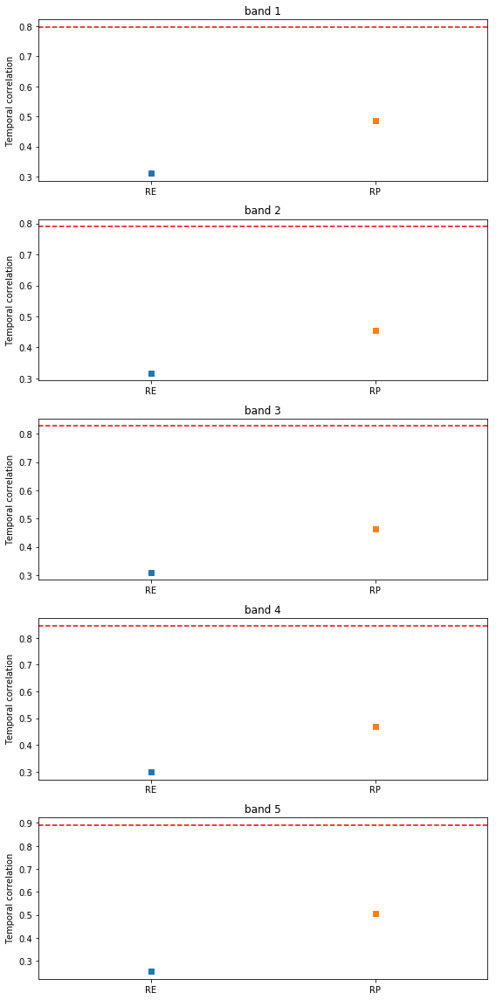

In [25]:
plt.figure(figsize=(8,16))
for i in range(len(net.bands)):
    # Original network
    CC_on = compute_temporal_correlation(
        #net.A[:,:,i,:,:].values.reshape(net.A.shape[0],net.A.shape[1],net.A.shape[3]*net.A.shape[4])
        net.A[:,:,i,:,:].stack(observations=("trials", "time")).values
    )
    # Randomize on edges
    CC_re = compute_temporal_correlation(
        A_r[:,:,i,:,:].reshape(A_r.shape[0],A_r.shape[1],A_r.shape[3]*A_r.shape[4])
    )
    # Randomize on time
    CC_rt = compute_temporal_correlation(
        A_s[:,:,i,:,:].reshape(A_s.shape[0],A_s.shape[1],A_s.shape[3]*A_s.shape[4])
    )
    # Plotting
    plt.subplot(5,1,i+1)
    plt.plot(1, CC_re, marker='s')
    plt.plot(3, CC_rt, marker='s')
    plt.hlines(CC_on, 0, 4, linestyle='--', color = 'r')
    plt.xlim([0,4])
    plt.ylabel('Temporal correlation')
    plt.xticks([1,3], ['RE', 'RP'])
    plt.title(bands[i])
plt.tight_layout()

### Jaccard index

In [26]:
J = {}
for i in tqdm( range(len(net.bands)) ): 
    #A_aux = reshape_trials(net.A[:,:,i,:], net.super_tensor.attrs['nT'], len(net.tarray))
    #J[str(i)] = jaccard_index(A_aux, mirror=True)
    J[str(i)] = jaccard_index(net.A[:,:,i,:,:].values, mirror=False)


  0%|          | 0/5 [00:00<?, ?it/s]/home/vinicius/GrayData-Analysis/GDa/net/temporal.py:54: RuntimeWarning: invalid value encountered in true_divide
  J = num/den

100%|██████████| 5/5 [00:30<00:00,  6.01s/it]



100%|██████████| 5/5 [00:00<00:00,  8.30it/s]


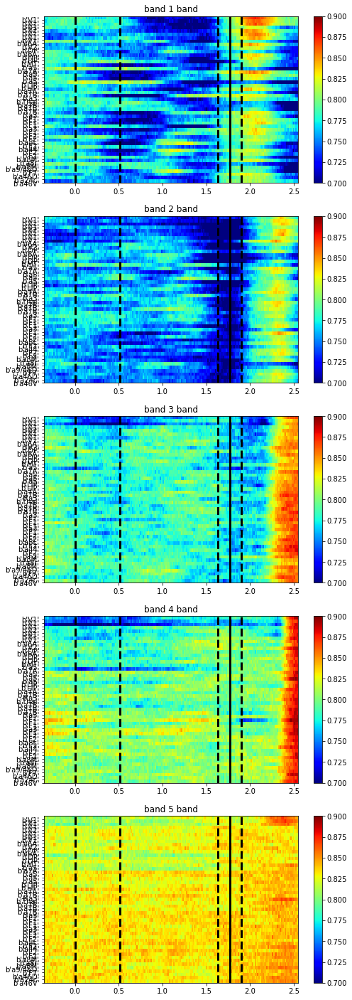

In [27]:
plt.figure(figsize=(8,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    plt.imshow(np.nansum(J[str(i)], axis=1)/J[str(i)].shape[1], aspect = 'auto', 
                         cmap = 'jet', origin = 'lower',
                         extent = [net.tarray[0],net.tarray[-1],0,49], vmin=.7, vmax=0.9);plt.colorbar()
    plt.vlines(0, 0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       0, 49, linestyle='-', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.yticks(range(49), net.session_info['areas'])
    plt.title(bands[i] + ' band')


100%|██████████| 5/5 [00:07<00:00,  1.48s/it]


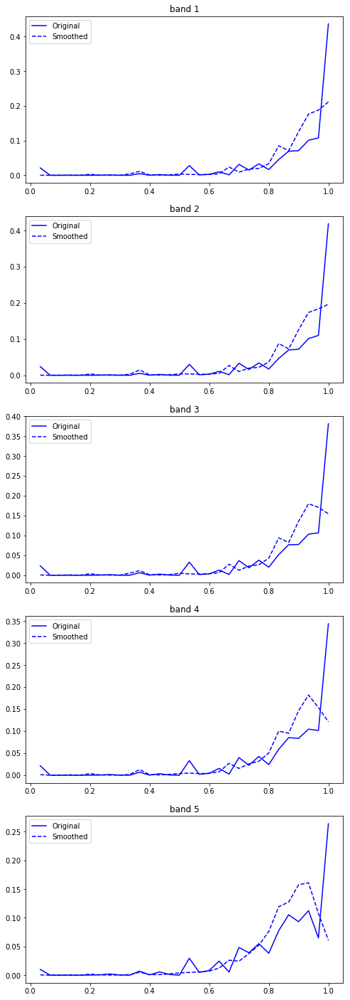

In [28]:
plt.figure(figsize=(8,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    aux = J[str(i)][~np.isnan(J[str(i)])].flatten(order='C')
    c, x = np.histogram(aux, 30)
    plt.plot(x[1:], c/np.sum(c), 'b')
    plt.title(bands[i] + ' bands')
    c, x = np.histogram(smooth(aux, 3), 30)
    plt.plot(x[1:], c/np.sum(c), 'b--')
    plt.title(bands[i])
    plt.legend(['Original', 'Smoothed'])

### Filtering trials

If one wants to analyse specific trials, for instance trials were the ODRT was performed, the __trials_info__ dictionary can be used to do so. To illustrate, let's work only with trials of type 1, were the monkey was successful.

In [22]:
net.trial_info.head()

,trial_index,behavioral_response,match_image,match_location,match_on,nonmatch_image,nonmatch_location,num_trials,reaction_time,sample_image,sample_location,sample_off,sample_on,trial_type
0,0,NaN,NaN,NaN,2654.0,NaN,NaN,1006.0,NaN,NaN,NaN,1495.0,975.0,2.0
1,1,1.0,2.0,7.0,2824.0,4.0,3.0,1006.0,145.0,2.0,1.0,1371.0,851.0,1.0
2,2,1.0,5.0,8.0,2946.0,4.0,4.0,1006.0,205.0,5.0,1.0,1600.0,1093.0,1.0
3,3,1.0,2.0,3.0,2954.0,3.0,7.0,1006.0,260.0,2.0,1.0,1528.0,1021.0,1.0
4,9,1.0,4.0,7.0,2759.0,2.0,3.0,1006.0,178.0,4.0,1.0,1480.0,973.0,1.0


In [23]:
# Getting the number for those trials
filtered_trials     = net.trial_info[(net.trial_info['trial_type']==1.0)\
                                   & (net.trial_info['behavioral_response']==1.0)].trial_index.values
# Getting the index for those trials
filtered_trials_idx = net.trial_info[(net.trial_info['trial_type']==1.0)\
                                   & (net.trial_info['behavioral_response']==1.0)].index.values

In [24]:
print(filtered_trials[::10])
print(filtered_trials_idx[::10])

[  1  20  43  61  78 106 124 145 159 171 181 198 211 225 243 256 266 281
 299 317 330 346 368 383 398 415 432 450 468 479 495 513 533 544 559 574
 587 607 622 644 660 675 690 702 718 735 750 775 792 808 822 839 855 868]
[  1  11  25  37  50  65  80  92 103 114 124 135 147 157 168 178 188 200
 214 227 237 248 262 274 287 300 312 324 336 347 358 370 384 395 405 415
 426 438 450 461 474 485 495 506 517 528 539 554 565 576 587 599 610 620]


In [25]:
net.super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 750, time: 194)>
array([[[[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True, False, ..., False, False,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False,  True,  True, ..., False, False,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]]],


       [[[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]],


       [[[False, False, False, ..., False, False, False],
         [ True, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, 

In [26]:
# Filter supertensor for the desired trials
filtered_super_tensor = net.super_tensor.sel(trials = filtered_trials)

In [27]:
filtered_super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 540, time: 194)>
array([[[[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [ True,  True, False, ..., False, False,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False,  True, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]],


       [[[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False,  True, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[ True, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, 

In [28]:
filtered_adjacency = net.A.sel(trials = filtered_trials)

In [29]:
filtered_adjacency

<xarray.DataArray (roi_1: 49, roi_2: 49, bands: 5, trials: 540, time: 194)>
array([[[[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[1., 1., 1., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 0., ..., 0., 0., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 1., ..., 1., 1., 1.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.],
          [0., 0., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          [1., 1.,

In [30]:
# Randomized adjacency matrix for the filtered data
A_r = np.empty_like(filtered_adjacency)
for t in tqdm( range(len(filtered_trials)) ):
    for i in range(len(net.bands)):
        A_r[:,:,i,t,:] = randomize_edges(filtered_adjacency[:,:,i,t,:].values, n_rewires=1000)

100%|██████████| 540/540 [06:53<00:00,  1.31it/s]


### Average coherence

Text(0, 0.5, 'Average coherence')

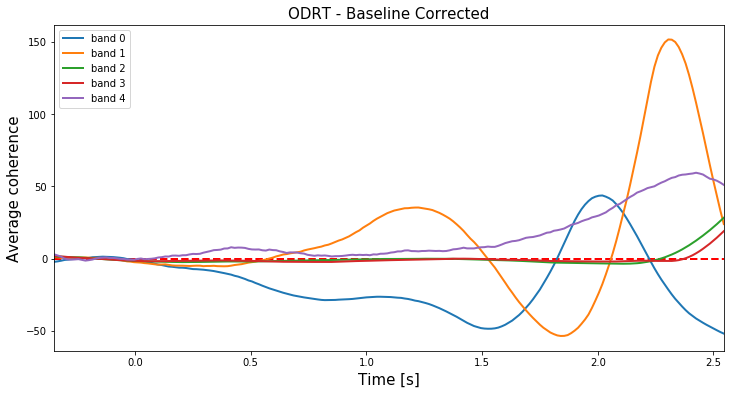

In [31]:
plt.figure(figsize=(12,6))
# Averaged supertensor
avg_coh = filtered_super_tensor.mean(dim='links').mean(dim='trials')
# Baseline indexes
b_idx   = net.tarray<0
for i in range(len(net.bands)):
    Z = (avg_coh[i]-avg_coh[i,b_idx].mean())/avg_coh[i,b_idx].std()
    plt.plot(net.tarray, Z, lw=2, label='band ' + str(i) )
plt.hlines(0,net.tarray[0],net.tarray[-1], linestyles='--', color='r', lw=2)
plt.xlim([net.tarray[0],net.tarray[-1]])
plt.legend()
plt.title('ODRT - Baseline Corrected', fontsize=15)
plt.xlabel('Time [s]', fontsize=15)
plt.ylabel('Average coherence', fontsize=15)

In [32]:
avg_coh = filtered_super_tensor.mean(dim='links')

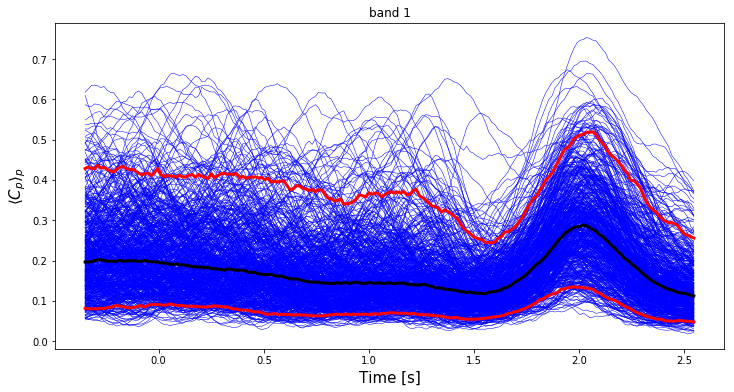

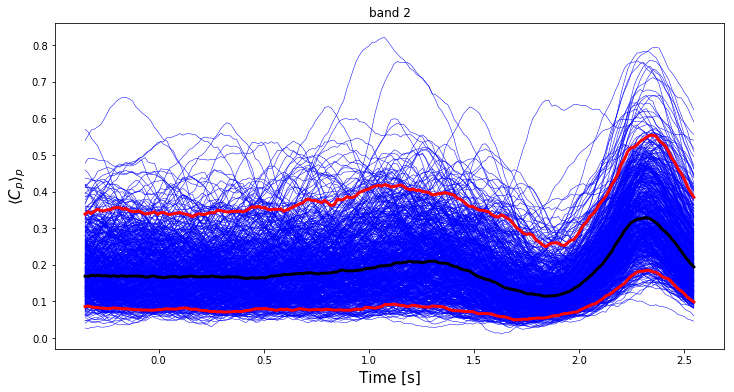

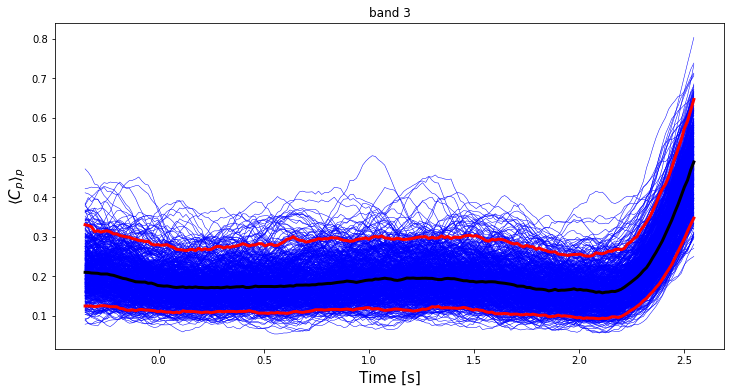

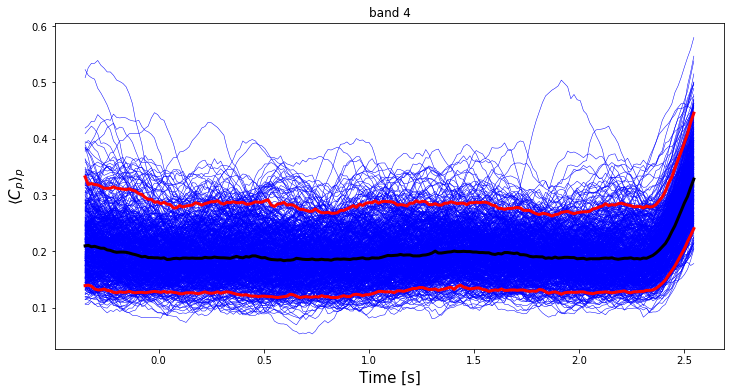

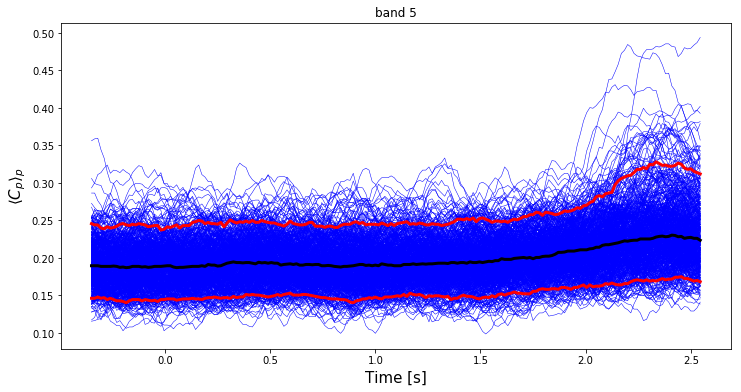

In [33]:
for b in range(len(net.bands)):
    plt.figure(figsize=(12,6))
    for i in range(avg_coh.shape[1]):
        plt.plot(net.tarray, avg_coh[b,i,:], 'b', lw=.5)
    plt.plot(net.tarray, avg_coh[b,:,:].median(dim='trials'), 'k', lw=3)
    plt.plot(net.tarray, avg_coh[b,:,:].quantile(0.95, dim='trials'), 'r', lw=3)
    plt.plot(net.tarray, avg_coh[b,:,:].quantile(0.05, dim='trials'), 'r', lw=3)
    plt.title(bands[b])
    plt.ylabel(r'$\langle C_{p}\rangle_{p}$',fontsize=15)
    plt.xlabel('Time [s]',fontsize=15)

### Network measures

We can use the filtered super tensor to compute all sorts of networkd measures. Let's start by analysing the network measurements averaged over trials.

In [34]:
#Q_data  = np.load('../network_statistics/tt_1_br_1.npy', allow_pickle=True).item()
#Q       = Q_data['original']
#Qr      = Q_data['null']

In [35]:
##################################################################################
# DICTIONARIES TO STORE THE NETWORK MEASURES
##################################################################################
measures = ['degree', 'clustering', 'coreness', 'modularity']

# Q is used to represent an arbritary network measurement
Q = {}
# To store the measures on the randomized networks
Qr = {}

for m in measures:
    Q[m]  = {}
    Qr[m] = {}
    for i in range(len(net.bands)):
        Q[m][str(i)]  = {}
        Qr[m][str(i)] = {}

### Node degree

In [36]:
##################################################################################
# NODES' DEGREE
##################################################################################
for i in tqdm( range(len(net.bands)) ): 
    Q['degree'][str(i)]  = compute_nodes_degree(filtered_adjacency[:,:,i,:,:].values, mirror=False) 

100%|██████████| 5/5 [00:01<00:00,  3.04it/s]


In [37]:
 print(Q['degree'][str(i)].shape)

(49, 540, 194)


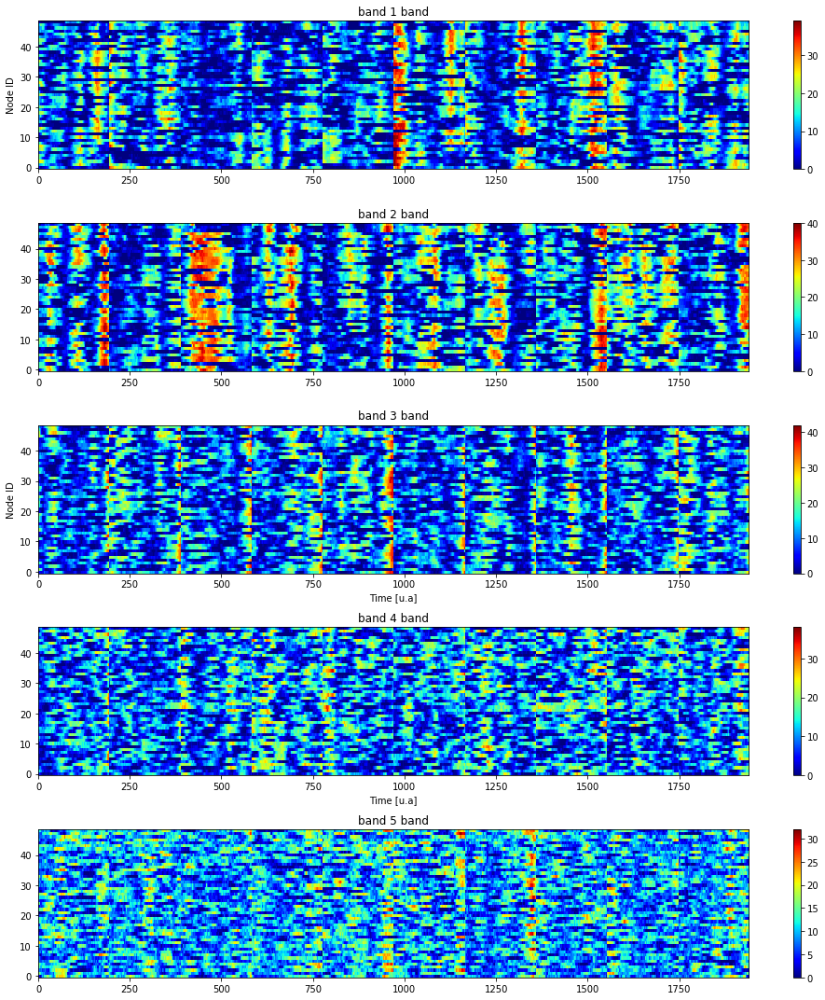

In [38]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q['degree'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_degree.png')

It is hard to compare both the weighted and binary version of the measure by means of the raster plot, however we can measure the summed strength/degree of the network for a more general view. Let's plot the the summed degree avareged on trials for each frequency band:

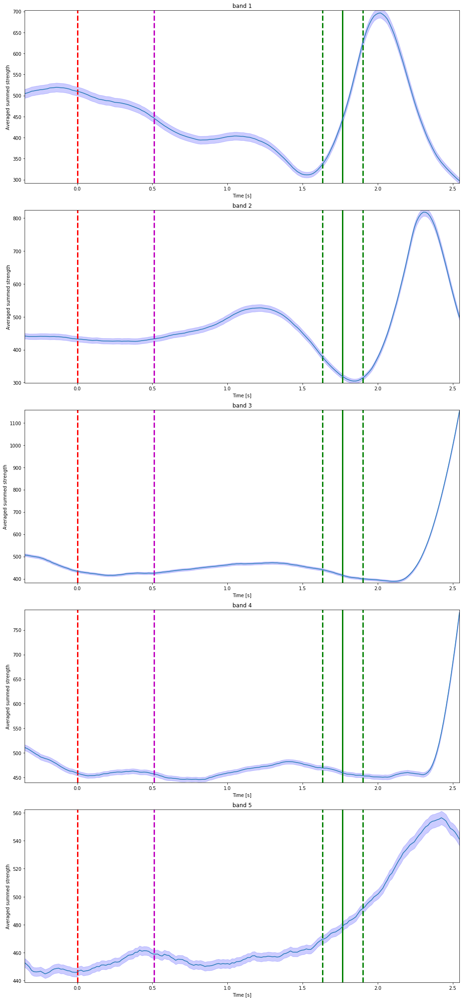

In [39]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d = Q['degree'][str(j)].sum(axis=0)
    # Average over trials
    s_d_m = s_d.mean(axis = 0) 
    # Std over trials
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_strength.png')

We can also measure the same quantities for the randomized version of the adjacency matrices:

In [40]:
for i in tqdm( range(len(net.bands)) ): 
    Qr['degree'][str(i)]  = compute_nodes_degree(A_r[:,:,i,:,:], mirror=False) 

100%|██████████| 5/5 [00:01<00:00,  3.04it/s]


Let's compare a random adjacency matrix with its randomized version.

Text(0.5, 1.0, 'Randomized, band 1 observation 89')

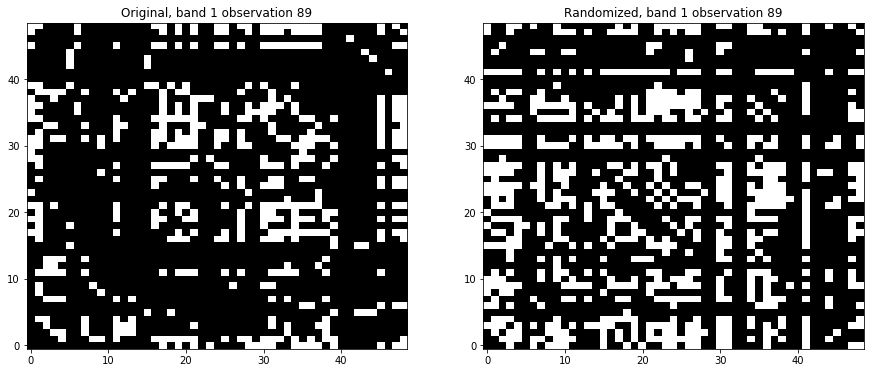

In [41]:
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
t_rnd = np.random.randint(0, net.super_tensor.shape[-1])
plt.imshow(net.A[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin='lower')
plt.title(r'Original, band 1 observation ' + str(t_rnd))
plt.subplot(1,2,2)
plt.imshow(A_r[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin='lower')
plt.title(r'Randomized, band 1 observation ' + str(t_rnd))

Next we plot the average summed degree for the original and randomized networks

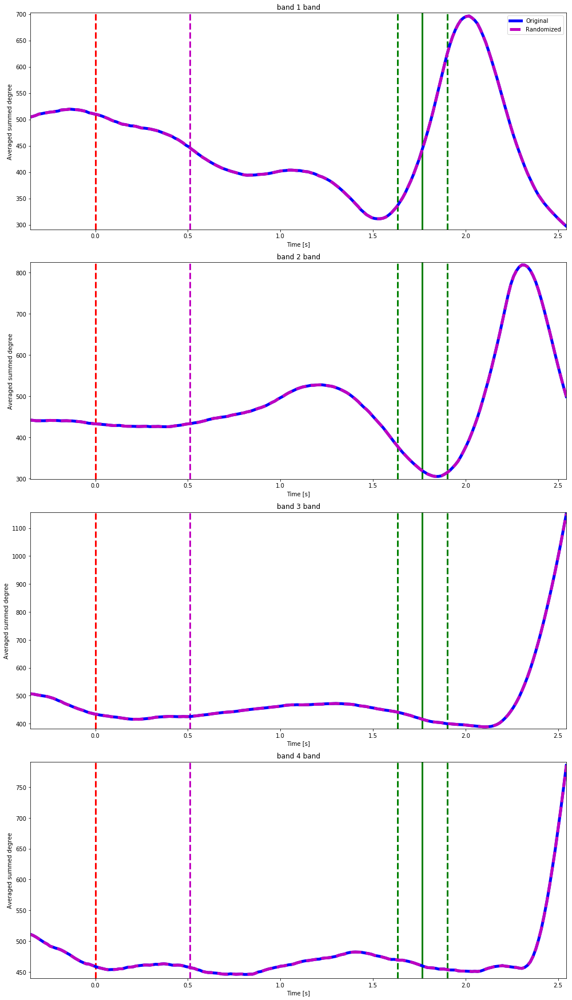

In [42]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands)-1 ):
    plt.subplot(5,1,j+1)
    # Original
    s_d = Q['degree'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d = Qr['degree'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed degree')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/strength_random_edges.png')

### Coreness 

In [43]:
for i in range(len(net.bands)):
    Q['coreness'][str(i)] = np.zeros([net.super_tensor.attrs['nC'],
                                      len(filtered_trials),
                                      len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Q['coreness'][str(i)][:,t,:] = compute_nodes_coreness(filtered_adjacency[:,:,i,t,:].values, is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 5942.16it/s]


100%|██████████| 194/194 [00:00<00:00, 6233.25it/s]


100%|██████████| 194/194 [00:00<00:00, 5911.12it/s]


100%|██████████| 194/194 [00:00<00:00, 5944.67it/s]


100%|██████████| 194/194 [00:00<00:00, 5819.01it/s]


100%|██████████| 194/194 [00:00<00:00, 6124.87it/s]


100%|██████████| 194/194 [00:00<00:00, 5753.75it/s]


100%|██████████| 194/194 [00:00<00:00, 5825.21it/s]


100%|██████████| 194/194 [00:00<00:00, 5874.84it/s]


100%|██████████| 194/194 [00:00<00:00, 5803.19it/s]


100%|██████████| 194/194 [00:00<00:00, 6163.14it/s]


100%|██████████| 194/194 [00:00<00:00, 5626.63it/s]


100%|██████████| 194/194 [00:00<00:00, 5932.10it/s]


100%|██████████| 194/194 [00:00<00:00, 5753.63it/s]


100%|██████████| 194/194 [00:00<00:00, 5898.99it/s]


100%|██████████| 194/194 [00:00<00:00, 5696.23it/s]


100%|██████████| 194/194 [00:00<00:00, 5417.48it/s]


100%|██████████| 194/194 [00:00<00:00, 5544.43it/s]


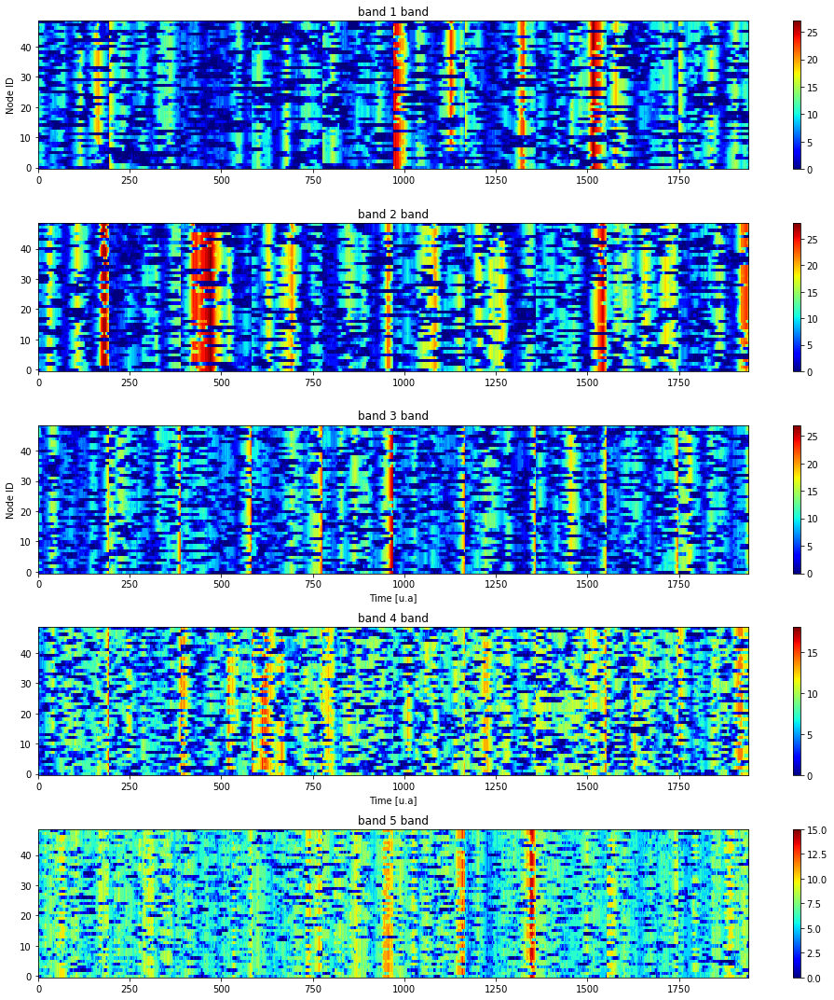

In [44]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q['coreness'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_coreness.png')

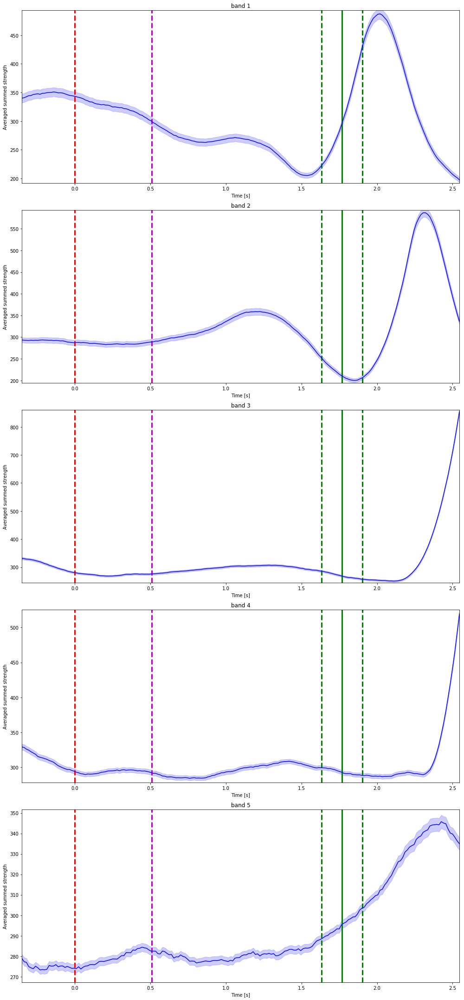

In [45]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    s_d = Q['coreness'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_coreness.png')

### Coreness - Excess

In [46]:
for i in range(len(net.bands)):
    Qr['coreness'][str(i)] = np.zeros([net.super_tensor.attrs['nC'],
                                      len(filtered_trials),
                                      len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Qr['coreness'][str(i)][:,t,:] = compute_nodes_coreness(A_r[:,:,i,t,:], is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 5413.99it/s]


100%|██████████| 194/194 [00:00<00:00, 5215.66it/s]


100%|██████████| 194/194 [00:00<00:00, 4997.02it/s]


100%|██████████| 194/194 [00:00<00:00, 5176.34it/s]


100%|██████████| 194/194 [00:00<00:00, 5213.02it/s]


100%|██████████| 194/194 [00:00<00:00, 5540.31it/s]


100%|██████████| 194/194 [00:00<00:00, 5157.67it/s]


100%|██████████| 194/194 [00:00<00:00, 4785.77it/s]


100%|██████████| 194/194 [00:00<00:00, 3802.67it/s]


100%|██████████| 194/194 [00:00<00:00, 3888.09it/s]


100%|██████████| 194/194 [00:00<00:00, 5744.93it/s]


100%|██████████| 194/194 [00:00<00:00, 4983.56it/s]


100%|██████████| 194/194 [00:00<00:00, 5135.54it/s]


100%|██████████| 194/194 [00:00<00:00, 3763.38it/s]


100%|██████████| 194/194 [00:00<00:00, 5083.37it/s]


100%|██████████| 194/194 [00:00<00:00, 4915.64it/s]


100%|██████████| 194/194 [00:00<00:00, 5239.07it/s]


100%|██████████| 194/194 [00:00<00:00, 5123.12it/s]


100%|██████████| 5/5 [00:00<00:00, 18.81it/s]


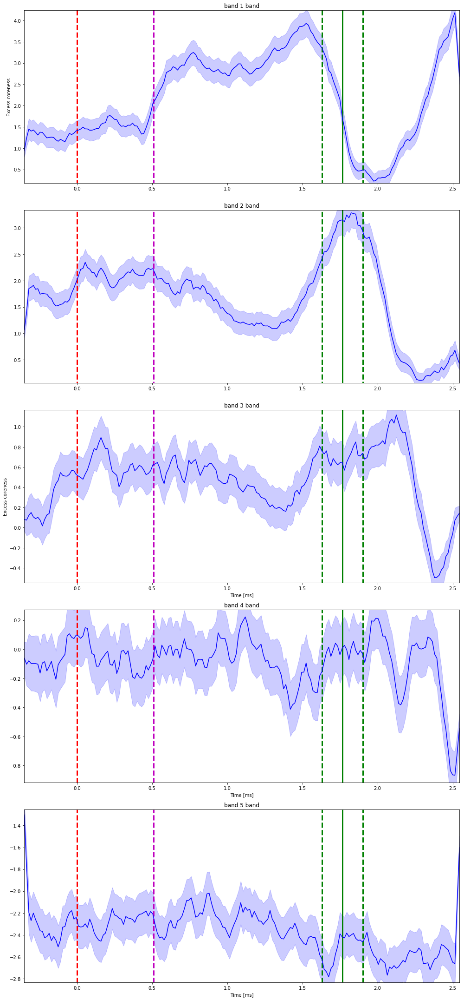

In [47]:
plt.figure(figsize=(14,30))
for j in tqdm( range(net.bands.shape[0]) ):
    # Summed for nodes
    null = Qr['coreness'][str(j)].sum(axis = 0)
    orig = Q['coreness'][str(j)].sum(axis = 0)
    # Excess 
    E    = 100*(orig - null)/null
    # Average over trials
    Em   = smooth( E.mean(axis = 0), 5)
    # Std over trials
    Es   = smooth( E.std(axis = 0) / np.sqrt(E.shape[0]), 5)
    # Plotting
    plt.subplot(5,1,j+1)
    plt.plot(net.tarray, Em, color = 'b')
    plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([Em.min()-.05, Em.max()+.05])
    if j == 0 or j == 2: plt.ylabel('Excess coreness')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_coreness.png')

### Clustering

In [48]:
for i in range(len(net.bands)):
    Q['clustering'][str(i)] = np.zeros([net.super_tensor.attrs['nC'],
                                      len(filtered_trials),
                                      len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Q['clustering'][str(i)][:,t,:] = compute_nodes_clustering(filtered_adjacency[:,:,i,t,:].values, is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 4441.78it/s]


100%|██████████| 194/194 [00:00<00:00, 4762.91it/s]


100%|██████████| 194/194 [00:00<00:00, 3753.78it/s]


100%|██████████| 194/194 [00:00<00:00, 5141.93it/s]


100%|██████████| 194/194 [00:00<00:00, 5227.18it/s]


100%|██████████| 194/194 [00:00<00:00, 5326.73it/s]


100%|██████████| 194/194 [00:00<00:00, 4974.63it/s]


100%|██████████| 194/194 [00:00<00:00, 5067.32it/s]


100%|██████████| 194/194 [00:00<00:00, 5064.80it/s]


100%|██████████| 194/194 [00:00<00:00, 4875.87it/s]


100%|██████████| 194/194 [00:00<00:00, 5506.68it/s]


100%|██████████| 194/194 [00:00<00:00, 5176.70it/s]


100%|██████████| 194/194 [00:00<00:00, 5101.98it/s]


100%|██████████| 194/194 [00:00<00:00, 5106.82it/s]


100%|██████████| 194/194 [00:00<00:00, 5073.13it/s]


100%|██████████| 194/194 [00:00<00:00, 4960.92it/s]


100%|██████████| 194/194 [00:00<00:00, 5255.31it/s]


100%|██████████| 194/194 [00:00<00:00, 5196.27it/s]


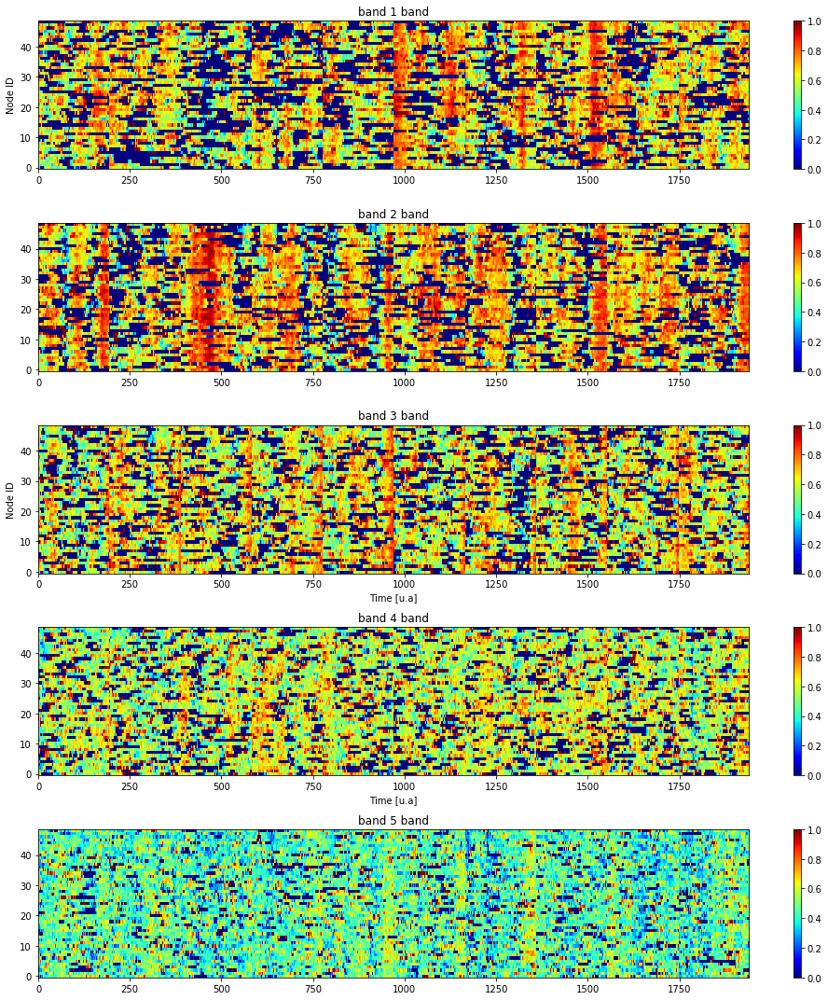

In [49]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q['clustering'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_clustering.png')

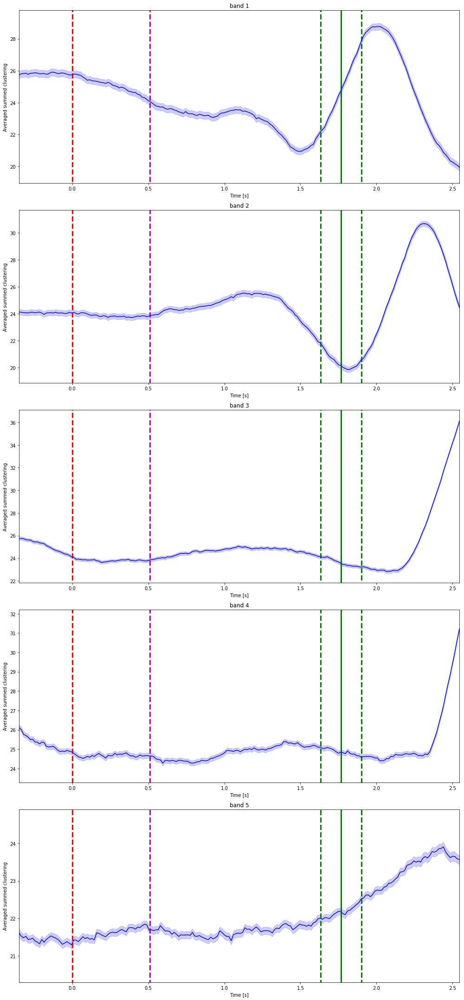

In [50]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    s_d = Q['clustering'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-1, s_d_m.max()+1])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_clustering.png')

### Clustering - Excess

In [51]:
for i in range(len(net.bands)):
    Qr['clustering'][str(i)] = np.zeros([net.super_tensor.attrs['nC'],
                                      len(filtered_trials),
                                      len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Qr['clustering'][str(i)][:,t,:] = compute_nodes_clustering(A_r[:,:,i,t,:], is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 4582.21it/s]


100%|██████████| 194/194 [00:00<00:00, 4960.22it/s]


100%|██████████| 194/194 [00:00<00:00, 4475.08it/s]


100%|██████████| 194/194 [00:00<00:00, 4784.36it/s]


100%|██████████| 194/194 [00:00<00:00, 4854.49it/s]


100%|██████████| 194/194 [00:00<00:00, 4903.61it/s]


100%|██████████| 194/194 [00:00<00:00, 4509.40it/s]


100%|██████████| 194/194 [00:00<00:00, 4721.75it/s]


100%|██████████| 194/194 [00:00<00:00, 4682.46it/s]


100%|██████████| 194/194 [00:00<00:00, 4779.27it/s]


100%|██████████| 194/194 [00:00<00:00, 5060.07it/s]


100%|██████████| 194/194 [00:00<00:00, 4799.06it/s]


100%|██████████| 194/194 [00:00<00:00, 4836.60it/s]


100%|██████████| 194/194 [00:00<00:00, 4674.15it/s]


100%|██████████| 194/194 [00:00<00:00, 4715.35it/s]


100%|██████████| 194/194 [00:00<00:00, 4522.91it/s]


100%|██████████| 194/194 [00:00<00:00, 4629.47it/s]


100%|██████████| 194/194 [00:00<00:00, 4775.46it/s]


  0%|          | 0/5 [00:00<?, ?it/s]/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib64/python3.6/site-packages/numpy/core/_methods.py:117: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
 20%|██        | 1/5 [00:00<00:01,  2.71it/s]/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys
100%|██████████| 5/5 [00:00<00:00,  8.45it/s]


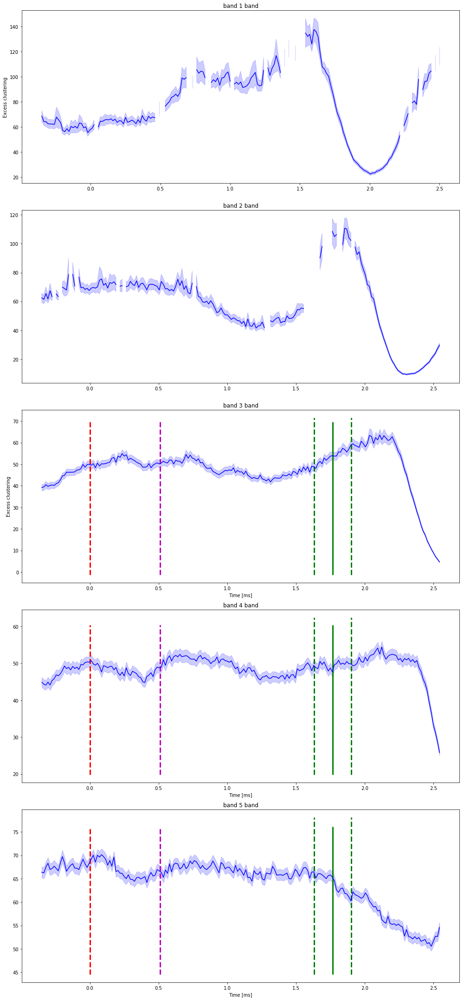

In [52]:
plt.figure(figsize=(14,30))
for j in tqdm( range(net.bands.shape[0]) ):
    # Summed for nodes
    null = Qr['clustering'][str(j)].sum(axis = 0)
    orig = Q['clustering'][str(j)].sum(axis = 0)
    # Excess 
    E    = 100*(orig - null)/null
    # Average over trials
    Em   = E.mean(axis = 0)
    # Std over trials
    Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
    # Plotting
    plt.subplot(5,1,j+1)
    plt.plot(net.tarray, Em, color = 'b')
    plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
    #plt.xlim([net.tarray[0],net.tarray[-1]])
    #plt.ylim([Em.min()-1, Em.max()+1])
    if j == 0 or j == 2: plt.ylabel('Excess clustering')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_clustering.png')

### Modularity

In [53]:
for i in range(len(net.bands)):
    Q['modularity'][str(i)] = np.zeros([len(filtered_trials),
                                        len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Q['modularity'][str(i)][t,:] = compute_network_modularity(filtered_adjacency[:,:,i,t,:].values, is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 1478.61it/s]


100%|██████████| 194/194 [00:00<00:00, 1501.01it/s]


100%|██████████| 194/194 [00:00<00:00, 1476.20it/s]


100%|██████████| 194/194 [00:00<00:00, 1483.91it/s]


100%|██████████| 194/194 [00:00<00:00, 1449.16it/s]


100%|██████████| 194/194 [00:00<00:00, 1537.56it/s]


100%|██████████| 194/194 [00:00<00:00, 1447.64it/s]


100%|██████████| 194/194 [00:00<00:00, 1511.40it/s]


100%|██████████| 194/194 [00:00<00:00, 1465.43it/s]


100%|██████████| 194/194 [00:00<00:00, 1432.20it/s]


100%|██████████| 194/194 [00:00<00:00, 1563.56it/s]


100%|██████████| 194/194 [00:00<00:00, 1467.09it/s]


100%|██████████| 194/194 [00:00<00:00, 1505.35it/s]


100%|██████████| 194/194 [00:00<00:00, 1475.11it/s]


100%|██████████| 194/194 [00:00<00:00, 1438.70it/s]


100%|██████████| 194/194 [00:00<00:00, 1474.12it/s]


100%|██████████| 194/194 [00:00<00:00, 1354.94it/s]


100%|██████████| 194/194 [00:00<00:00, 1448.89it/s]


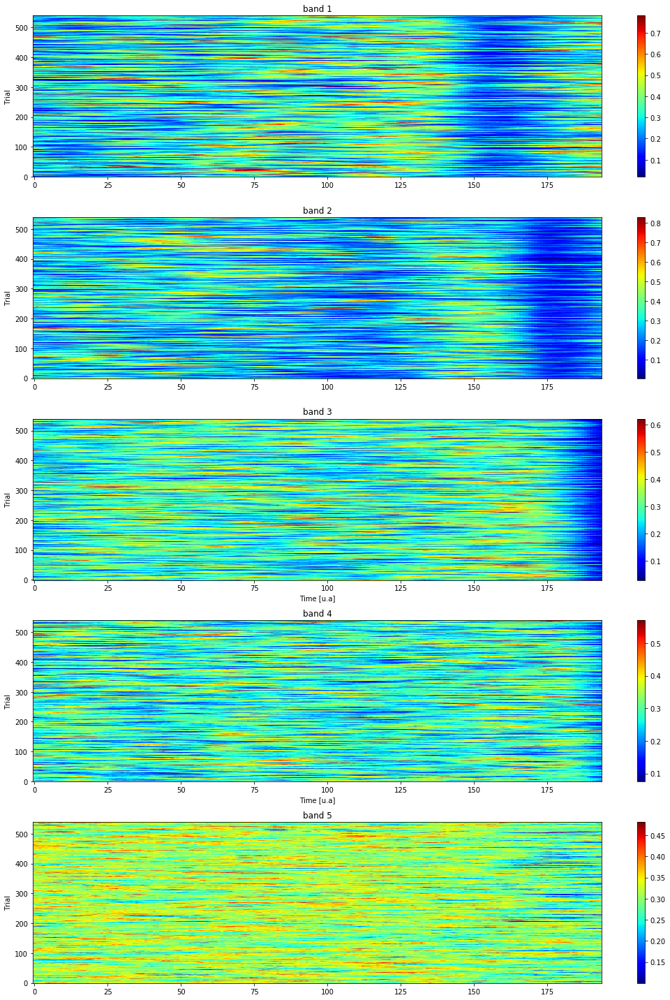

In [54]:
plt.figure(figsize=(15,20))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(Q['modularity'][str(i)], aspect='auto', cmap='jet', origin='lower')
    plt.colorbar()
    plt.title(bands[i])
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    plt.ylabel('Trial')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_modularity.png')

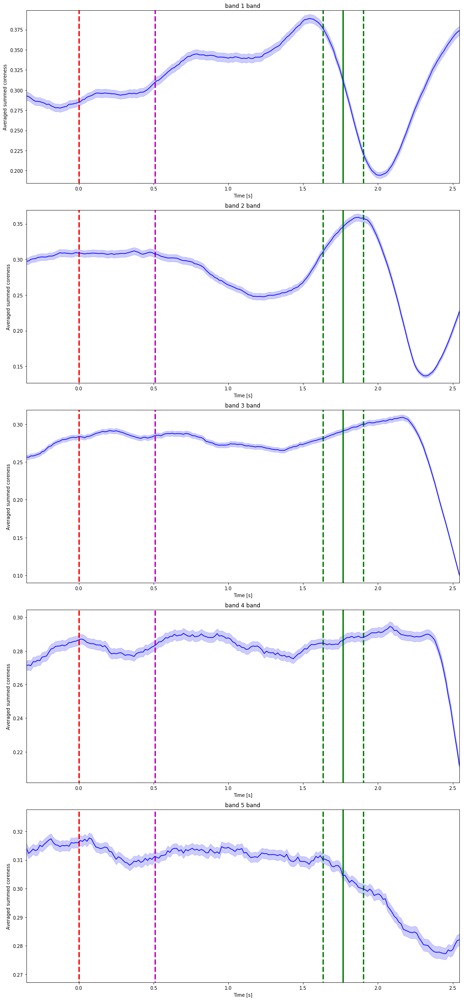

In [55]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    s_d = Q['modularity'][str(j)]
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j])
    #
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.01, s_d_m.max()+.01])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed coreness')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_modularity.png')

###  Modularity - Chance level

In [56]:
for i in range(len(net.bands)):
    Qr['modularity'][str(i)] = np.zeros([len(filtered_trials),
                                        len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Qr['modularity'][str(i)][t,:] = compute_network_modularity(A_r[:,:,i,t,:], is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 1341.84it/s]


100%|██████████| 194/194 [00:00<00:00, 1378.85it/s]


100%|██████████| 194/194 [00:00<00:00, 1338.52it/s]


100%|██████████| 194/194 [00:00<00:00, 1357.51it/s]


100%|██████████| 194/194 [00:00<00:00, 1334.62it/s]


100%|██████████| 194/194 [00:00<00:00, 1411.79it/s]


100%|██████████| 194/194 [00:00<00:00, 1318.57it/s]


100%|██████████| 194/194 [00:00<00:00, 1366.70it/s]


100%|██████████| 194/194 [00:00<00:00, 1366.87it/s]


100%|██████████| 194/194 [00:00<00:00, 1312.81it/s]


100%|██████████| 194/194 [00:00<00:00, 1446.35it/s]


100%|██████████| 194/194 [00:00<00:00, 1343.17it/s]


100%|██████████| 194/194 [00:00<00:00, 1384.59it/s]


100%|██████████| 194/194 [00:00<00:00, 1322.37it/s]


100%|██████████| 194/194 [00:00<00:00, 1315.32it/s]


100%|██████████| 194/194 [00:00<00:00, 1308.36it/s]


100%|██████████| 194/194 [00:00<00:00, 1346.14it/s]


100%|██████████| 194/194 [00:00<00:00, 1315.79it/s]


100%|██████████| 5/5 [00:00<00:00, 50.27it/s]


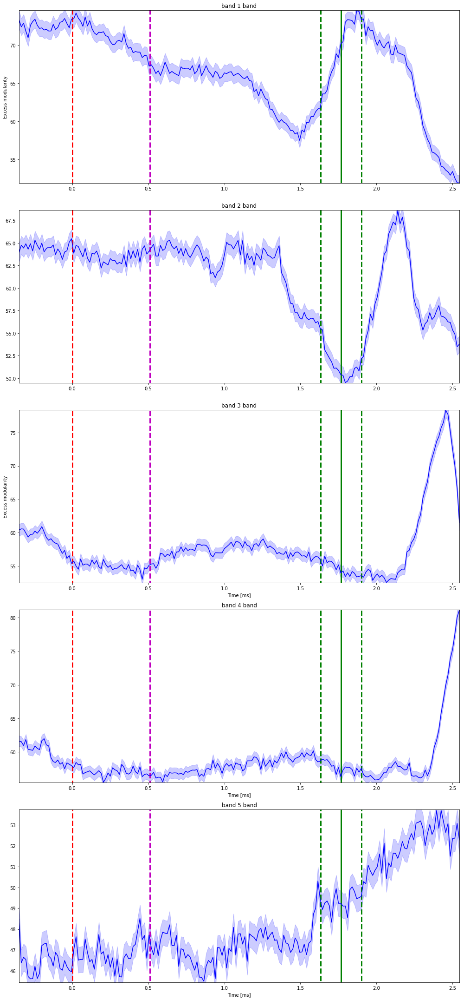

In [57]:
plt.figure(figsize=(14,30))
for j in tqdm( range(net.bands.shape[0]) ):
    plt.subplot(net.bands.shape[0],1,j+1)
    # Summed for nodes
    null = Qr['modularity'][str(j)]
    orig = Q['modularity'][str(j)]
    # Excess 
    E    = 100*(orig - null)/null
    # Average over trials
    Em   = E.mean(axis = 0)
    # Std over trials
    Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
    # Plotting

    plt.plot(net.tarray, Em, color = 'b')
    plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([Em.min()-.05, Em.max()+.05])

    if j == 0 or j == 2: plt.ylabel('Excess modularity')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_modularity.png')

### Allegiance  matrix

In order to compute the allegiance matrix we first have to compute the layerwise community labes of each node in order to verity how often they fall in the same module, the allegiance matrix can be computed by using the method __compute_allegiance_matrix__.

In [66]:
nC = net.super_tensor.attrs['nC']
nT = len(filtered_trials)
T  = np.zeros([nC,nC,len(net.bands),len(s_names)])

In [67]:
# Creating stages mask
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_idx], 
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_idx], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, nT, flatten=True)
print(s_mask['baseline'].shape)

(104760,)


In [68]:
filtered_adjacency_stacked = filtered_adjacency.stack(observations=("trials","time"))
for i in tqdm( range(len(net.bands)) ):
    for s_idx, s in zip(range(len(s_names)), s_names):
        T[:,:,i,s_idx] = compute_allegiance_matrix(
                           filtered_adjacency_stacked[:,:,i,s_mask[s]].values,
                           is_weighted=False) 


100%|██████████| 5/5 [12:42<00:00, 152.60s/it]


#### Band 1

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


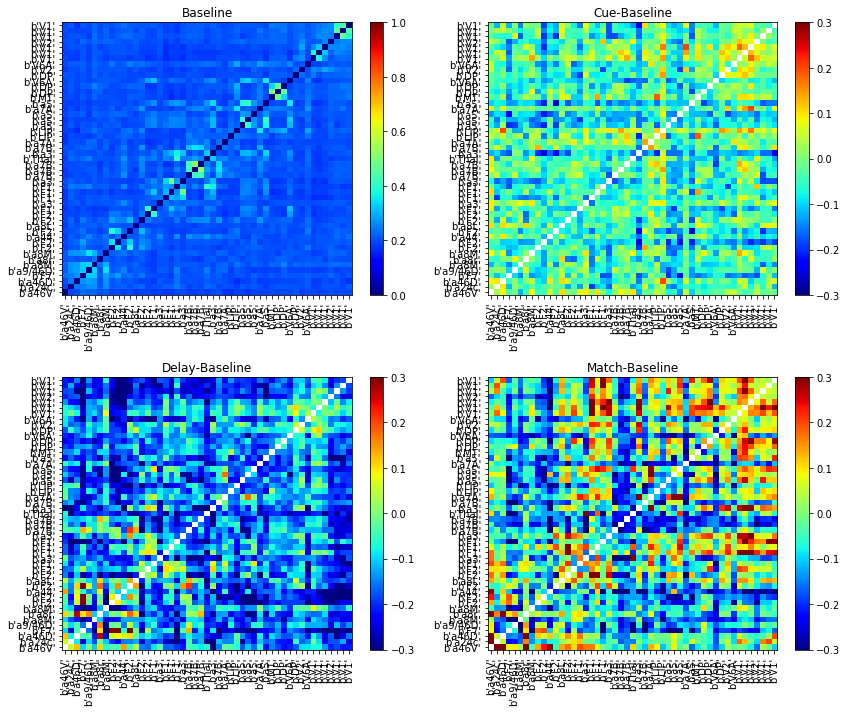

In [69]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,0,k]-T[:,:,0,0])/T[:,:,0,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,0,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_theta.png')

#### Band 2

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


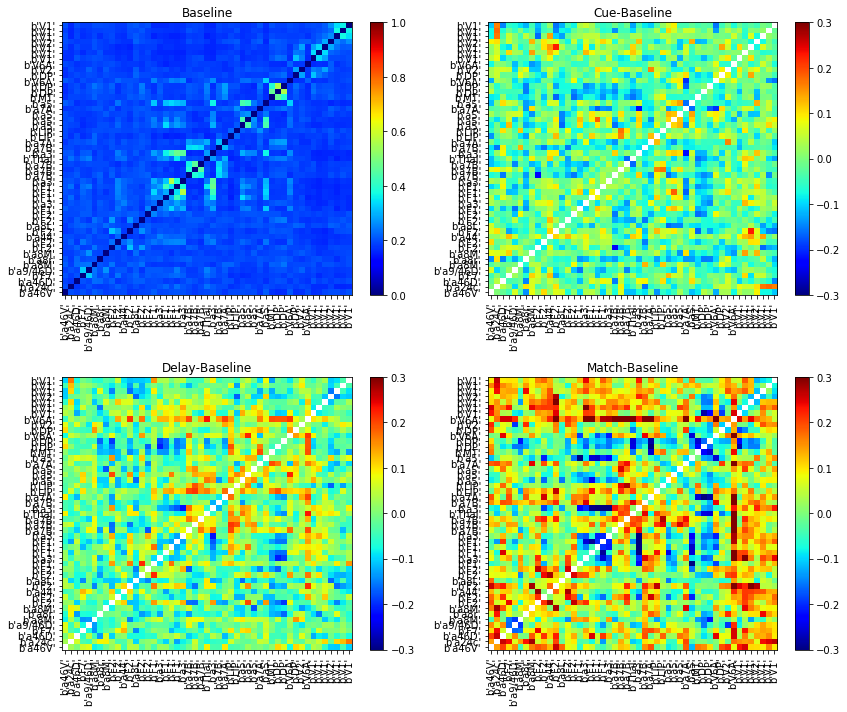

In [70]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,1,k]-T[:,:,1,0])/T[:,:,1,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,1,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_alpha.png')

#### Band 3

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


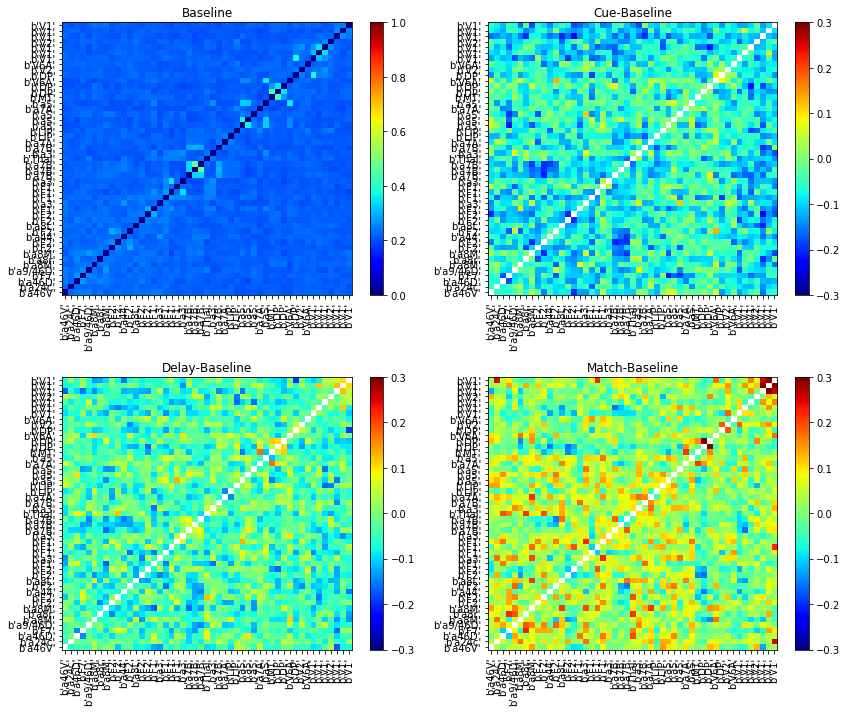

In [71]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,2,k]-T[:,:,2,0])/T[:,:,2,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,2,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_beta.png')

#### Band 4

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


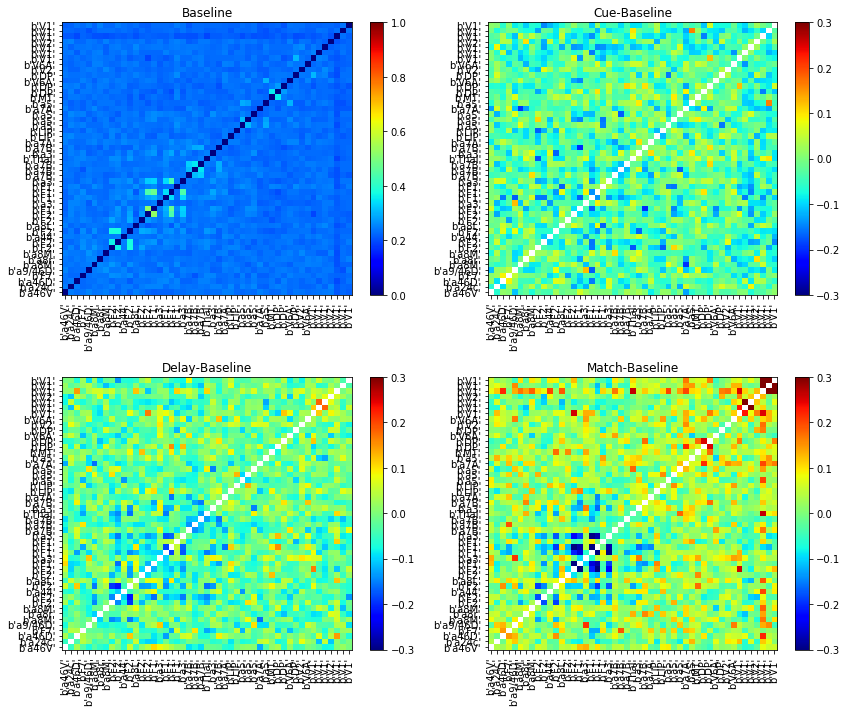

In [72]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,3,k]-T[:,:,3,0])/T[:,:,3,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,3,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_gamma.png')

#### Band 5

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


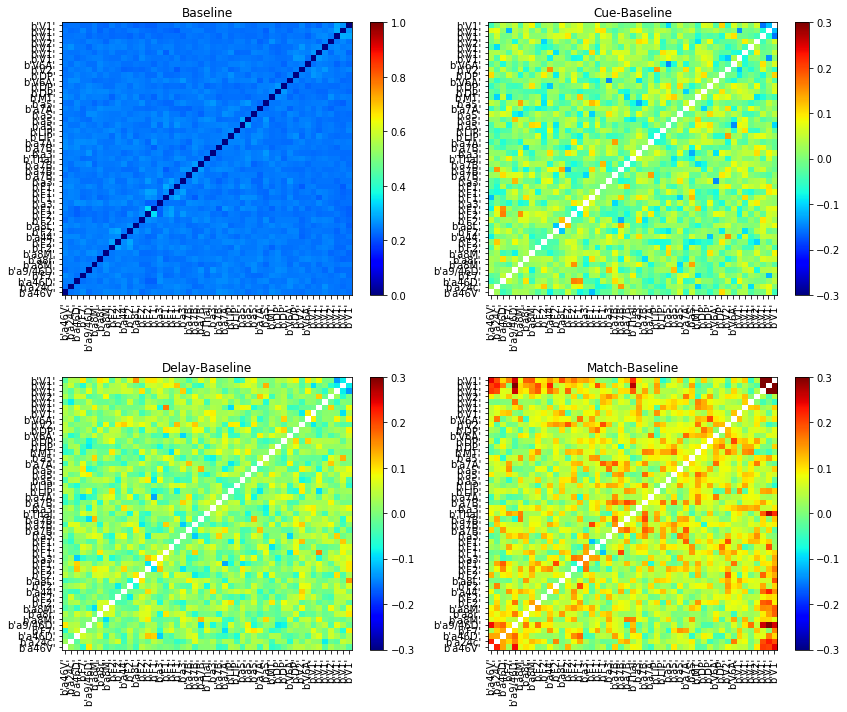

In [73]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,4,k]-T[:,:,4,0])/T[:,:,4,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,4,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_high_gamma.png')

### Plotting on the brain surface

Plotting some of the quantities we measured above in the brain surface.

In [58]:
# Creating stages mask with trials concatenated
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_idx], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, len(filtered_trials_idx), flatten=True)

In [59]:
from GDa.graphics.plot_brain_sketch import plot_node_brain_sketch, plot_edge_brain_sketch

In [60]:
Q['degree'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray)).shape

(49, 104760)

#### Plotting average strength 

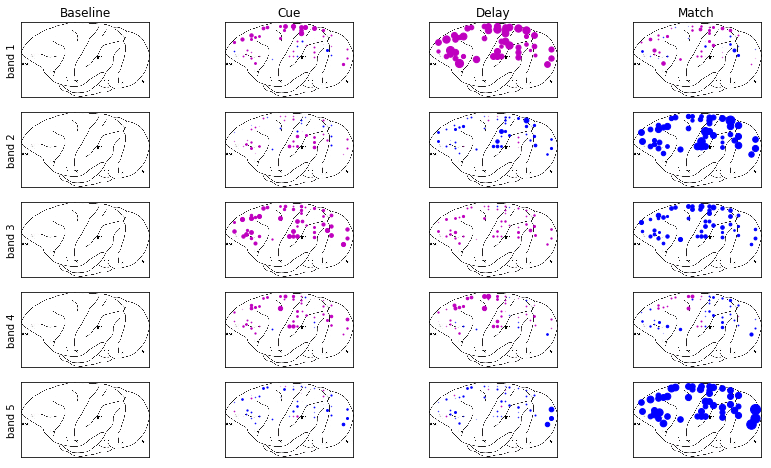

In [61]:
count = 1
alpha = 20
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['degree'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=-1)
    sst_b  = aux[:,s_mask['baseline']].std(axis=-1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_b-st_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c = aux[:,s_mask['cue']].mean(axis=-1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d = aux[:,s_mask['delay']].mean(axis=-1).mean(axis=-1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m = aux[:,s_mask['match']].mean(axis=-1).mean(axis=-1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/st_brain_map.png')

#### Plotting average coreness 

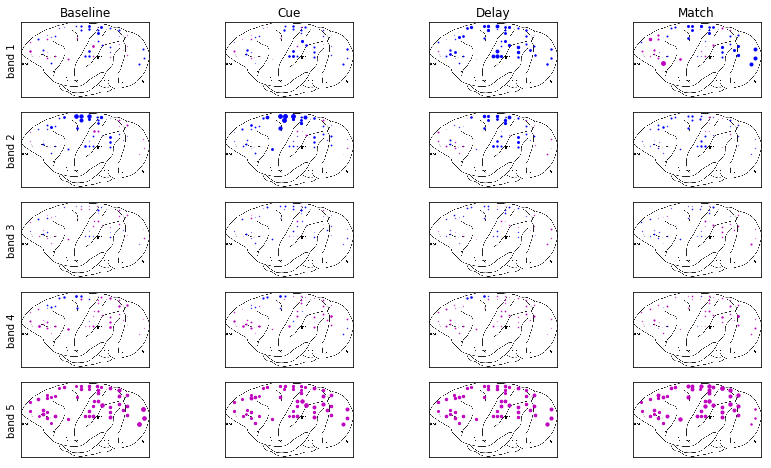

In [62]:
count = 1
alpha = 100
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    aux_r  = Qr['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=1)
    sst_b  = aux_r[:,s_mask['baseline']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = aux[:,s_mask['cue']].mean(axis=1)
    sst_c = aux_r[:,s_mask['cue']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = aux[:,s_mask['delay']].mean(axis=1)
    sst_d = aux_r[:,s_mask['delay']].mean(axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    #st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = aux[:,s_mask['match']].mean(axis=1)
    sst_m = aux_r[:,s_mask['match']].mean(axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    #st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/coreness_brain_map.png')

#### Plotting average coreness (95% percentile)

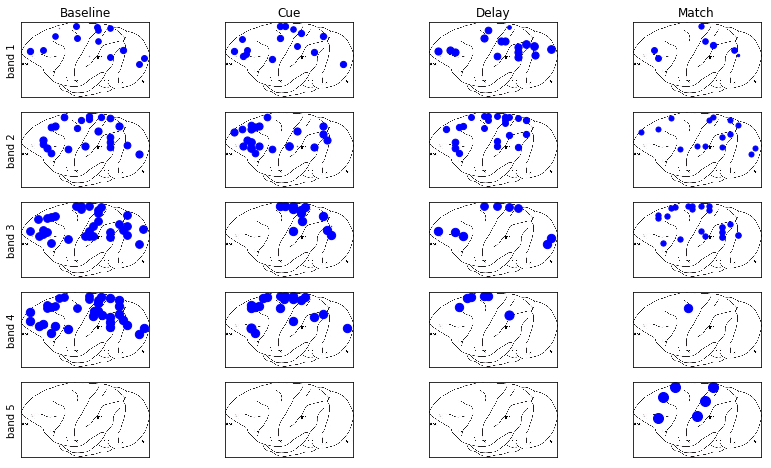

In [63]:
count = 1
alpha = 100
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    aux_r  = Qr['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = np.percentile(aux[:,s_mask['baseline']], 95, axis=1)
    sst_b  = np.percentile(aux_r[:,s_mask['baseline']], 95, axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = np.percentile(aux[:,s_mask['cue']], 95, axis=1)
    sst_c = np.percentile(aux_r[:,s_mask['cue']], 95, axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = np.percentile(aux[:,s_mask['delay']], 95, axis=1)
    sst_d = np.percentile(aux_r[:,s_mask['delay']], 95, axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = np.percentile(aux[:,s_mask['match']], 95, axis=1)
    sst_m = np.percentile(aux_r[:,s_mask['match']], 95, axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/coreness_brain_map95.png')

#### Plotting average clustering

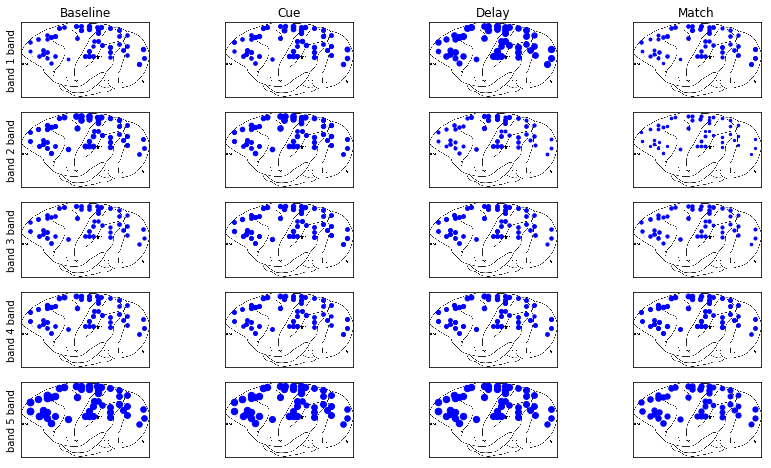

In [64]:
count = 1
alpha = 10
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['clustering'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    aux_r  = Qr['clustering'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=1)
    sst_b  = aux_r[:,s_mask['baseline']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = aux[:,s_mask['cue']].mean(axis=1)
    sst_c = aux_r[:,s_mask['cue']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = aux[:,s_mask['delay']].mean(axis=1)
    sst_d = aux_r[:,s_mask['delay']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = aux[:,s_mask['match']].mean(axis=1)
    sst_m = aux_r[:,s_mask['match']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/clustering_brain_map.png')

### Finding temporal communities

Using teneto to find the temporal communities (testing)

In [81]:
from teneto import TemporalNetwork
from teneto import communitydetection

In [82]:
tnet = TemporalNetwork(from_array = filtered_adjacency[:,:,1,:20,:].stack(
                                        observations=('trials','time')).values, nettype = 'bu'
                       )

In [ ]:
out = communitydetection.temporal_louvain(tnet, resolution=1, intersliceweight=1, n_iter=100, 
                                          negativeedge='ignore', randomseed=None, 
                                          consensus_threshold=0.5, temporal_consensus=True, 
                                          njobs=40)

0


In [ ]:
plt.figure(figsize=(8,6))
plt.imshow(out, aspect = 'auto', cmap = 'jet', origin = 'lower', extent = [net.tarray[0],net.tarray[-1],0,48])
plt.colorbar()
plt.title(r'$\omega = 1$, and $\Gamma = 1$')
plt.yticks(net.session_info['areas'], net.session_info['areas'])
plt.xlabel('Time [ms]')

### Comparing with the intervealed fixation task

In [65]:
# Getting the number for fixation trials
filtered_trials_fix     = net.trial_info[(net.trial_info['trial_type']==2.0)].trial_index.values
# Getting the index for those trials
filtered_trials_fix_idx = net.trial_info[(net.trial_info['trial_type']==2.0)].index.values

In [66]:
# Filter supertensor for the desired trials
filtered_super_tensor_fix = net.super_tensor.sel(trials = filtered_trials_fix)

In [67]:
filtered_super_tensor_fix

<xarray.DataArray (links: 1176, bands: 5, trials: 76, time: 194)>
array([[[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]]],


       [[[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False]],

        [[ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, F

In [68]:
filtered_adjacency_fix = net.A.sel(trials = filtered_trials_fix)

In [69]:
filtered_adjacency_fix

<xarray.DataArray (roi_1: 49, roi_2: 49, bands: 5, trials: 76, time: 194)>
array([[[[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          [1., 1., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 1., 1., 1.],
          [1., 1., 1., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 

In [70]:
##################################################################################
# DICTIONARIES TO STORE THE NETWORK MEASURES FOR THE FIXATION TASK
##################################################################################
measures = ['degree', 'clustering', 'coreness', 'modularity']

# Q is used to represent an arbritary network measurement
Q_fix = {}
# To store the measures on the randomized networks
Qr_fix = {}

for m in measures:
    Q_fix[m]  = {}
    Qr_fix[m] = {}
    for i in range(len(net.bands)):
        Q_fix[m][str(i)]  = {}
        Q_fix[m][str(i)] = {}

### Average coherence

Text(0, 0.5, 'Average coherence')

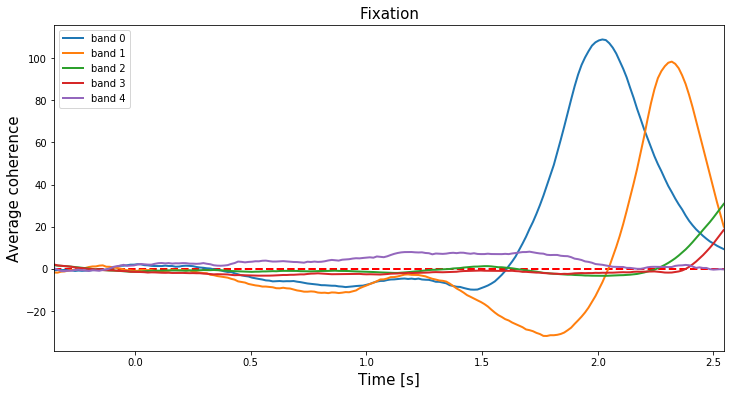

In [71]:
plt.figure(figsize=(12,6))
# Averaged supertensor
avg_coh = filtered_super_tensor_fix.mean(dim='links').mean(dim='trials')
# Baseline indexes
b_idx   = net.tarray<0
for i in range(len(net.bands)):
    Z = (avg_coh[i]-avg_coh[i,b_idx].mean())/avg_coh[i,b_idx].std()
    plt.plot(net.tarray, Z, lw=2, label='band ' + str(i) )
plt.hlines(0,net.tarray[0],net.tarray[-1], linestyles='--', color='r', lw=2)
plt.xlim([net.tarray[0],net.tarray[-1]])
plt.legend()
plt.title('Fixation', fontsize=15)
plt.xlabel('Time [s]', fontsize=15)
plt.ylabel('Average coherence', fontsize=15)

In [72]:
avg_coh = filtered_super_tensor_fix.mean(dim='links')

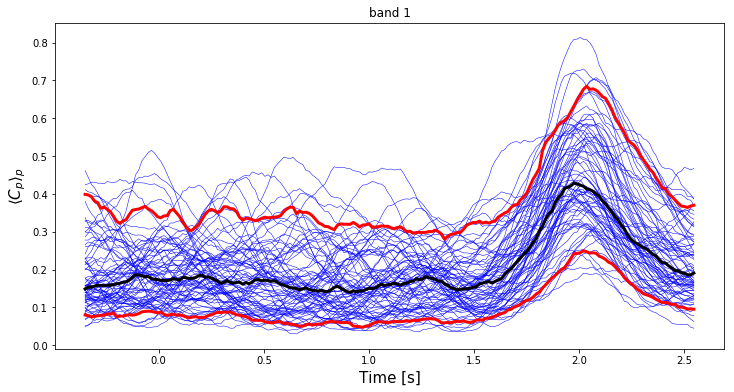

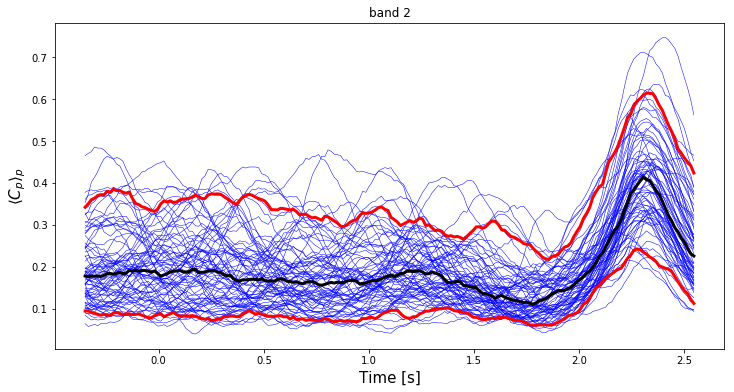

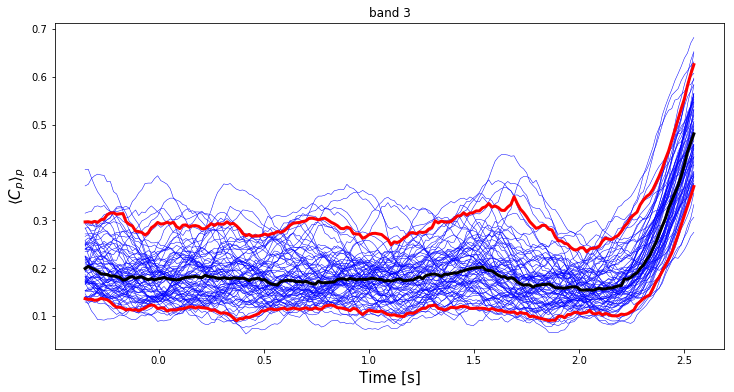

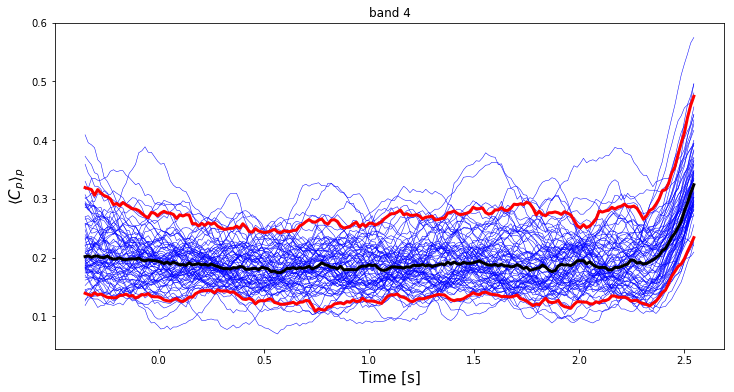

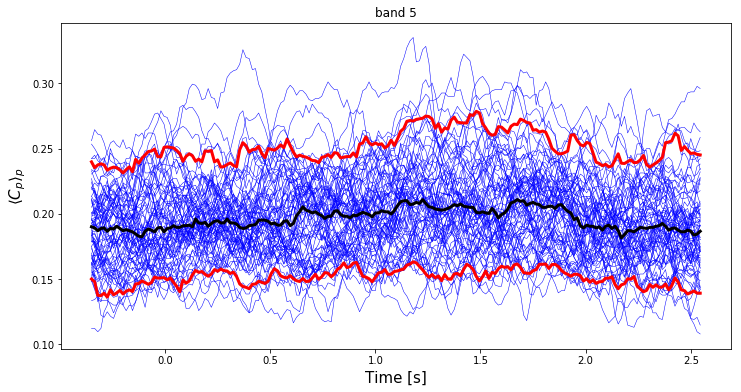

In [73]:
for b in range(len(net.bands)):
    plt.figure(figsize=(12,6))
    for i in range(avg_coh.shape[1]):
        plt.plot(net.tarray, avg_coh[b,i,:], 'b', lw=.5)
    plt.plot(net.tarray, avg_coh[b,:,:].median(dim='trials'), 'k', lw=3)
    plt.plot(net.tarray, avg_coh[b,:,:].quantile(0.95, dim='trials'), 'r', lw=3)
    plt.plot(net.tarray, avg_coh[b,:,:].quantile(0.05, dim='trials'), 'r', lw=3)
    plt.title(bands[b])
    plt.ylabel(r'$\langle C_{p}\rangle_{p}$',fontsize=15)
    plt.xlabel('Time [s]',fontsize=15)

### Strength

In [74]:
# Randomized adjacency matrix for the filtered data
A_r_fix = np.empty_like(filtered_adjacency_fix)
for t in tqdm( range(len(filtered_trials_fix)) ):
    for i in range(len(net.bands)):
        A_r_fix[:,:,i,t,:] = randomize_edges(filtered_adjacency_fix[:,:,i,t,:].values, n_rewires=1000)

100%|██████████| 76/76 [00:59<00:00,  1.27it/s]


In [75]:
##################################################################################
# NODES' DEGREE
##################################################################################
for i in tqdm( range(len(net.bands)) ): 
    Q_fix['degree'][str(i)]  = compute_nodes_degree(filtered_adjacency_fix[:,:,i,:,:].values, mirror=False)

100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


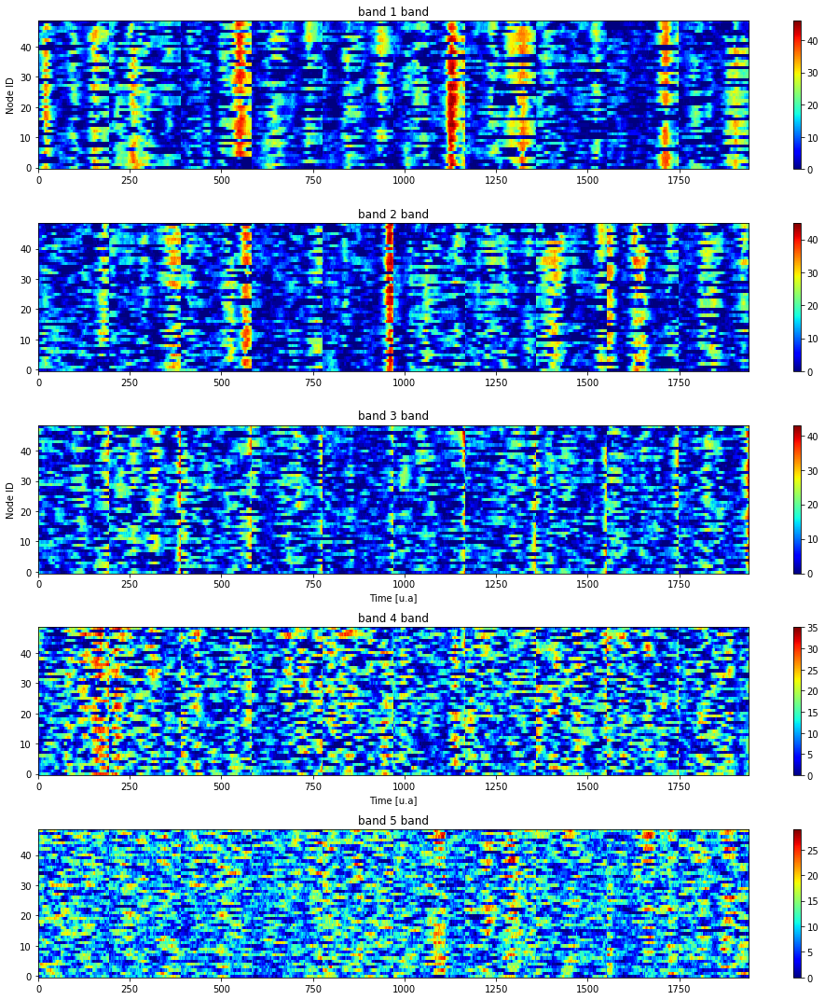

In [76]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q_fix['degree'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()

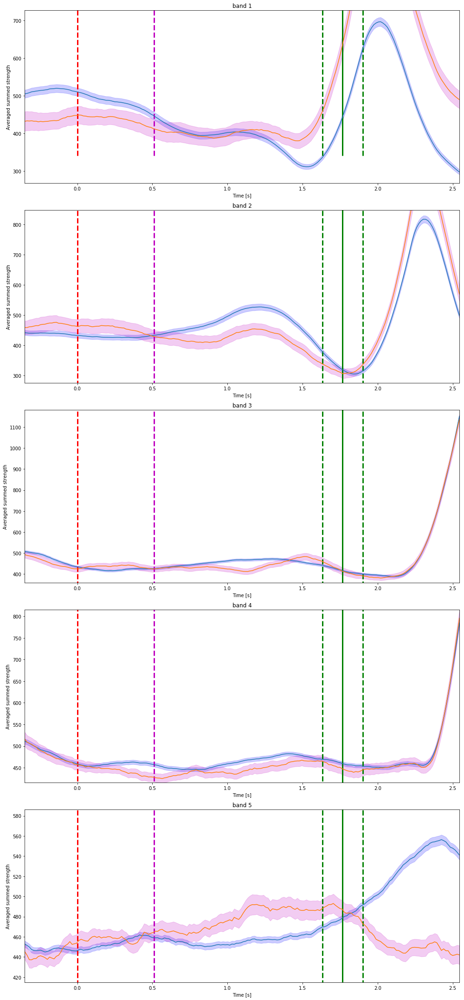

In [77]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    # ODRT
    s_d = Q['degree'][str(j)].sum(axis=0)
    # Average over trials
    s_d_m = s_d.mean(axis = 0) 
    # Std over trials
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    plt.ylim([s_d_m.min()-30, s_d_m.max()+30])
    # FIXATION
    s_d = Q_fix['degree'][str(j)].sum(axis=0)
    # Average over trials
    s_d_m = s_d.mean(axis = 0) 
    # Std over trials
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='m')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])

    plt.vlines(0, s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-40, s_d_m.max()+200, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()

### Plotting in the brain surface

In [78]:
# Creating stages mask
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_fix_idx], 
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_fix_idx],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_fix_idx], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, len(filtered_trials_fix_idx), flatten=True)
print(s_mask['baseline'].shape)

(14744,)


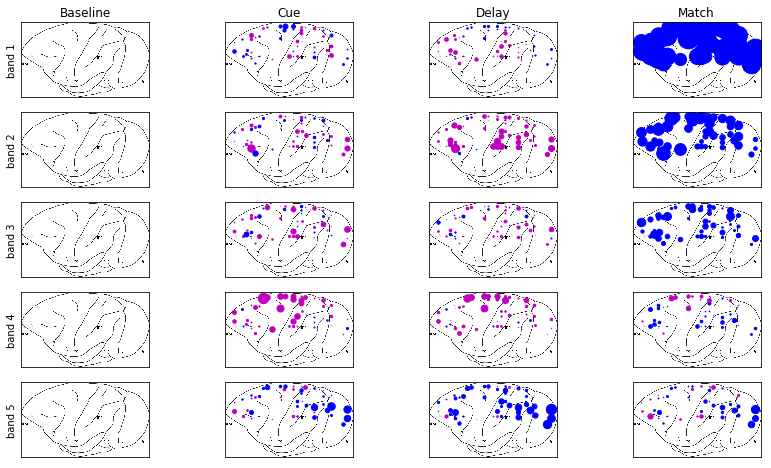

In [79]:
count = 1
alpha = 20
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q_fix['degree'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials_fix) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=-1)
    sst_b  = aux[:,s_mask['baseline']].std(axis=-1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_b-st_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c = aux[:,s_mask['cue']].mean(axis=-1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d = aux[:,s_mask['delay']].mean(axis=-1).mean(axis=-1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m = aux[:,s_mask['match']].mean(axis=-1).mean(axis=-1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')